# MMLDT-CSET 2021
# Short Course 2: 
# Mechanistic Machine Learning for Engineering and Applied Science
# (5) Lab-1: Convolutional Neural Networks (CNNs) for Crack Detection

Instructors: Prof. J.S. Chen, Xiaolong He, Karan Taneja, Kristen Susuki (UC San Diego), Qizhi He (San Diego State University)

---

## Outline
1. Introduction to CNNs
    - Convolutional Layers
        - Zero Padding
        - Reducing Dimensionality by Strides
        - Convolutional Filters
        - Stacking Multiple Feature Maps
    - Pooling Layers
2. CNNs for Crack Detection
    - Data Preprocessing
    - CNN Architecture and Training
    - Crack Detection
    - Effects of Sizes of Training Data
3. Exercises:
    - Effects of Output Structures
    - Effects of Input Structures

### Note to Short Course Participants:
- **If you do not have the data and image files used for this Jupyter notebook, please download them (8.2 MB) from this [link](https://drive.google.com/drive/folders/14yDNGI8w7AuMPgk8QuVk8GUOlwAqyL-N?usp=sharing).**

- You do not need to run the training in Section 2 during the lab section, as it will require a lot of time and machine memory. The results that are shown in Section 2 are meant as additional examples for your review, which can be run at a later time.

## Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
from random import shuffle, randint, sample
import scipy.io as sio
from time import time
from IPython.display import Image
import os
import tensorflow as tf
from tensorflow import keras

# Fix seeds of random generators to make this notebook's output stable across runs
np.random.seed(126)
tf.random.set_seed(126)
random.seed(126)

# Check available CPUs and GPUs
import multiprocessing
print("Number of CPUs Available: ", multiprocessing.cpu_count())
print("Number of GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "cnn"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

Number of CPUs Available:  12
Number of GPUs Available:  1


# 1. Introduction to CNNs

**Convolutional neural networks (CNNs)** emerged from the study of the <font color="red">**brain’s visual cortex**</font>, broadly used in **image recognition** since the 1980s. 

- Overlapping **local receptive field**, limited region of the visual field, 


- **Smaller receptive fields** captures simple patterns, e.g., edges, orientations, corners


- **Larger receptive fields** capture more complex patterns, combinations of the lower-level patterns.
    - **Higher-level neurons are based on outputs of neighboring lower-level neurons**

<!-- <img src = "images/visual_cortex.PNG" width = "500"> -->

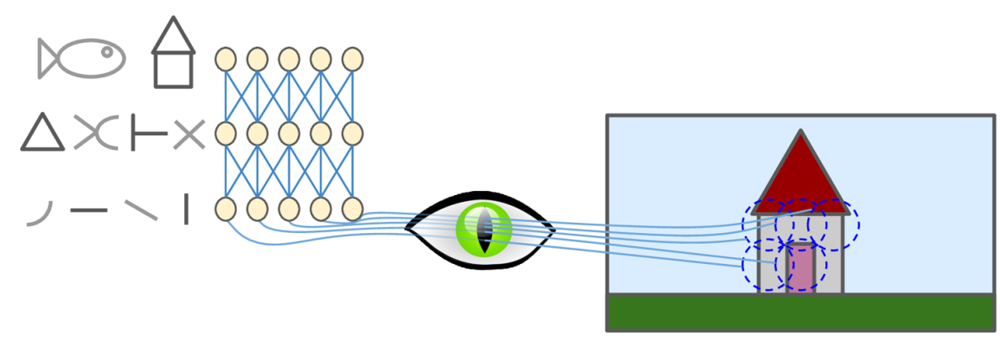

In [2]:
Image(filename="images/visual_cortex.PNG", width=500)

## 1.1 Convolutional Layers

The most important building block of a CNN is the **convolutional layer**: 

- Neurons in a convolutional layer are only connected to previous-layer pixels (neurons) in their **receptive fields**, reduced number of connections (parameters).


- This **hierarchical** architecture allows the network to concentrate on **small low-level features** in lower layers, then **assemble them into larger higher-level features** in higher layers.


- In a CNN, **each layer is represented in 2D**, easier to match neurons with their corresponding inputs.

<!-- <img src = "images/CNN_local_receptive_fields.PNG" width = "400"> -->

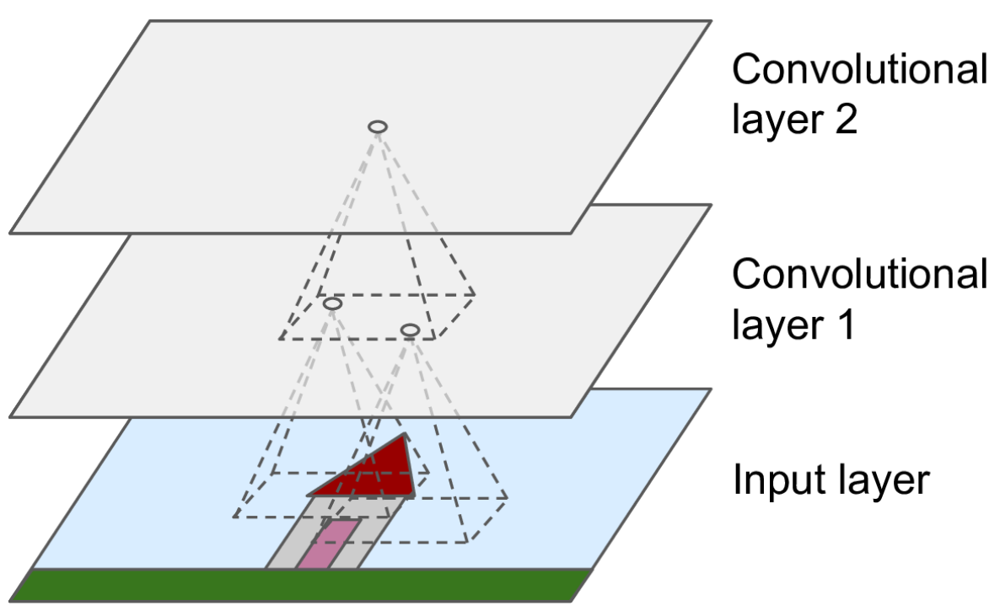

In [3]:
Image(filename="images/CNN_local_receptive_fields.PNG", width=350)

### 1.1.1 Zero Padding

**Add zeros around the inputs** in order for a layer to have the **same height and width** as the previous layer.

<!-- <img src = "images/CNN_zero_padding.PNG" width = "400"> -->

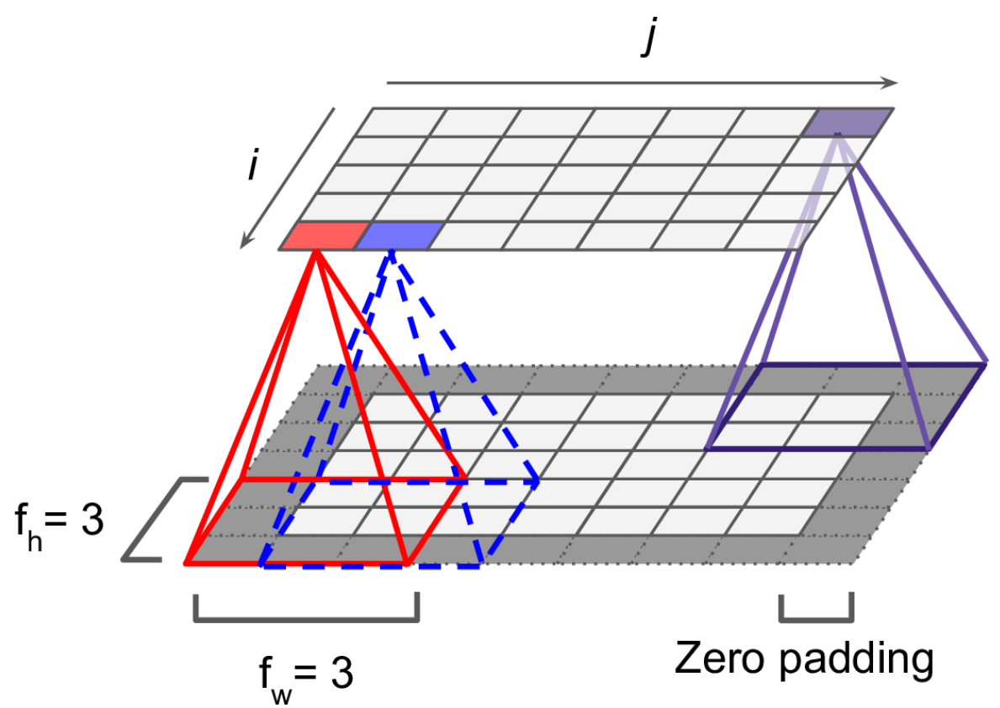

In [4]:
Image(filename="images/CNN_zero_padding.PNG", width=300)

### 1.1.2 Reducing Dimensionality by Strides

- It is also possible to connect a large input layer to a much smaller layer by **spacing out the receptive fields**. This dramatically **reduces the model’s computational complexity**. 


- The shift from one receptive field to the next is called the **stride**. 
    
<!-- <img src = "images/CNN_stride.PNG" width = "400"> -->

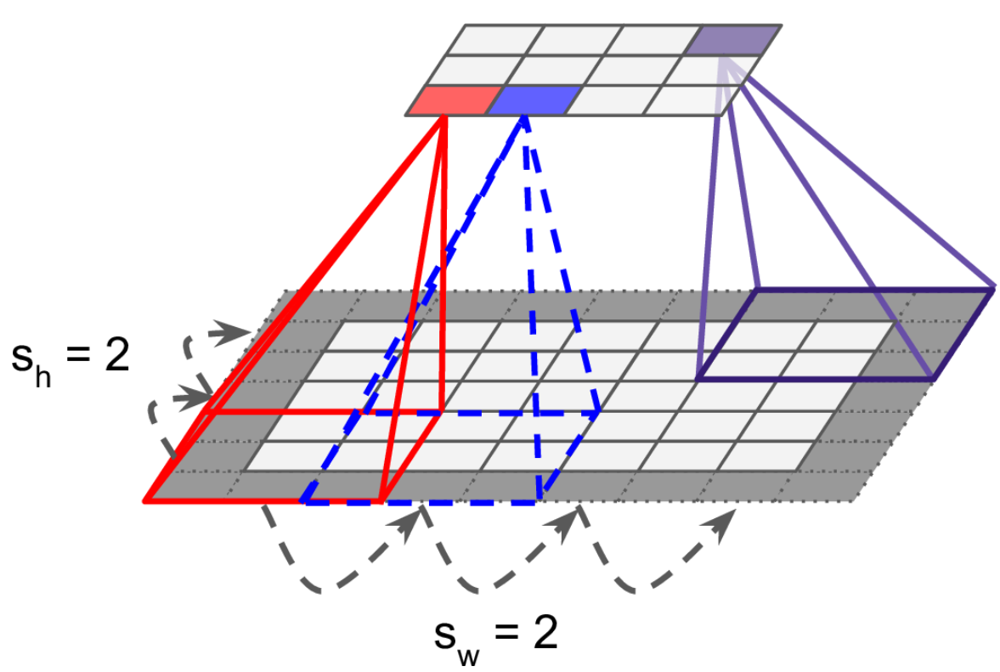

In [5]:
Image(filename="images/CNN_stride.PNG", width=300)

### 1.1.3 Convolutional Filters

- As a neuron's weights are only **non-zero** when they are associated with the connection related to the receptive fields, the **weights for the receptive field** can be represented as a **small image with a size of the receptive field**, called **convolutional filters** (or **convolutional kernels**).


- A layer of neurons using the **same convolutional filter** outputs a <font color='red'> **feature map**</font>, which **highlights the areas in an image that activate the filter the most**. 


- During training, <font color='red'> **convolutional layers will automatically learn the most useful filters for its task**</font>, and the layers above will learn to combine them into more complex patterns. 

<!-- <img src = "images/filters.png" width = "500"> -->

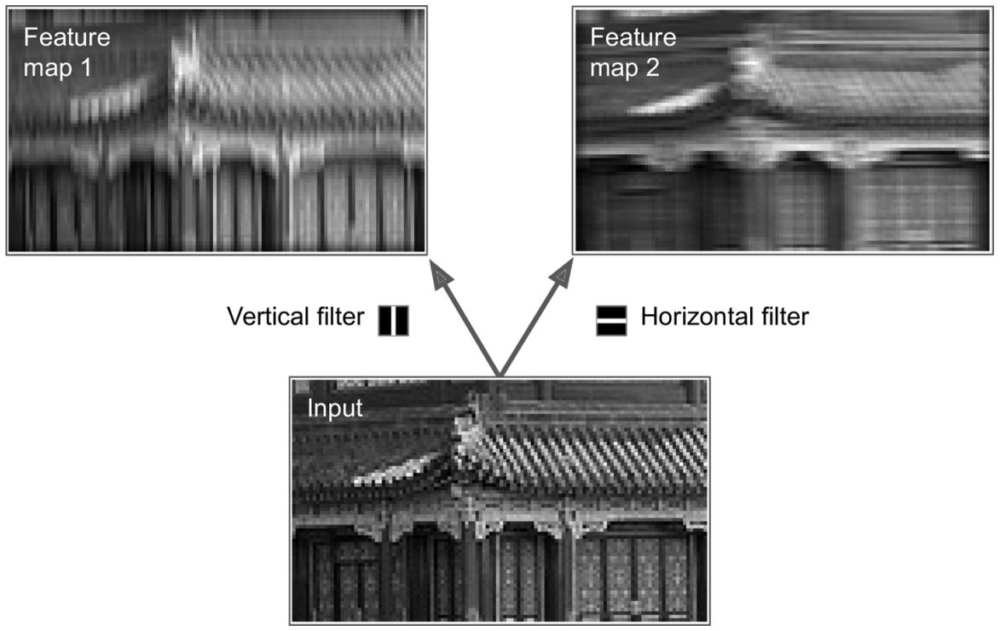

In [6]:
Image(filename="images/filters.PNG", width=500)

### 1.1.4 Stacking Multiple Feature Maps

- A convolutional layer can have **multiple convolutional filters** and **outputs one feature map per filter**. 


- <font color="red"> **All neurons within a given feature map have the same filter and thus share the same parameters**</font>. Neurons in different feature maps have different parameters. 


- A neuron’s receptive field **extends across all the previous layers’ feature maps**. 


- A convolutional layer simultaneously applies **multiple trainable filters** to its inputs.


### Note:

- The fact that **all neurons in a feature map share the same parameters** dramatically **reduces the number of parameters in the model**. 


- Once the CNN has learned to recognize a pattern in one location, it can recognize it in any other location. 


- In contrast, once a regular deep neural netwrok has learned to recognize a pattern in one location, it can recognize it only in that particular location.

[Convolution demo](https://cs231n.github.io/convolutional-networks/)

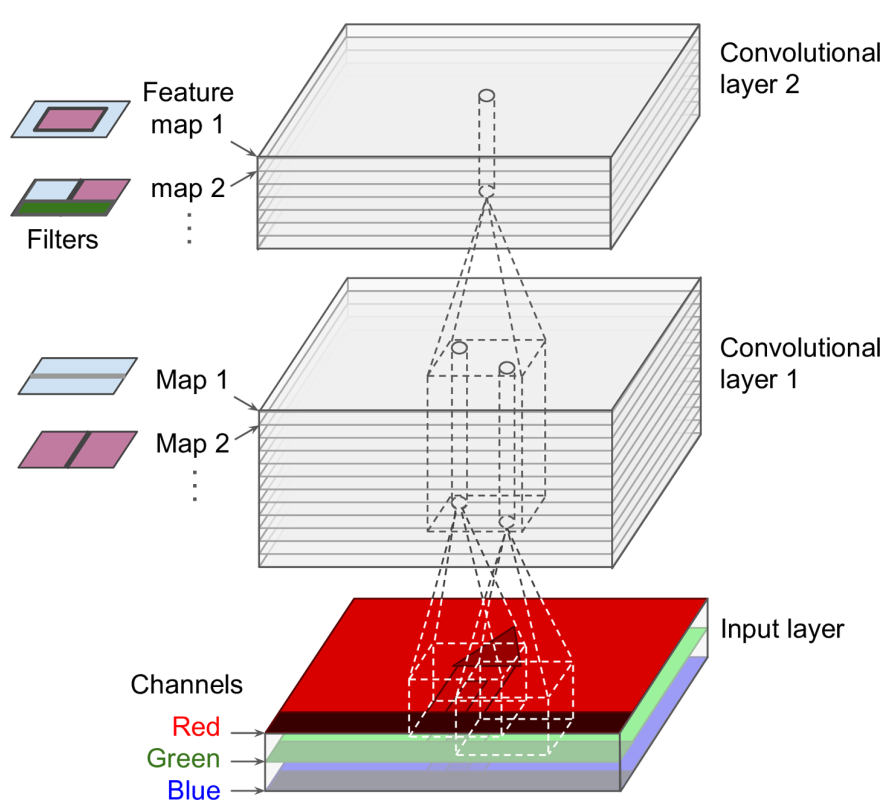

In [7]:
Image(filename="images/stacking_feature_maps.PNG", width=400)

## 1.2 Pooling Layers

- The goal of **pooling layers** is to **subsample** (i.e., **shrink**) the input image in order to reduce the **computational load**, the **memory usage**, and the **number of parameters** (thereby **limiting the risk of overfitting**).


- Like in convolutional layers, each neuron in a **pooling layer** is connected to the outputs of a limited number of neurons in the previous layer, located within a **small rectangular receptive field**. You must define its **size**, the **stride**, and the **padding** type, just like before. 


- However, a **pooling neuron has no weights**; all it does is **aggregate the inputs** using an **aggregation function** such as the **max** or **mean**. 

<table><tr>
<td> <img src="images/max_pooling.PNG" style="width: 500px;"/> </td>
<td> <img src="images/max_pool_pad1_stride2.gif" style="width: 600px;"/> </td>
</tr></table>

[source](https://towardsdatascience.com/a-visualization-of-the-basic-elements-of-a-convolutional-neural-network-75fea30cd78d) 

# 2. CNNs for Crack Detection

Automatic pavement crack detection is a challenging task that has been researched for decades due to the complicated pavement conditions in real world. [Fan et al. (2018)](https://arxiv.org/pdf/1802.02208.pdf) [1] proposed an automatic crack detection approach based on CNNs.

## 2.1 Data Preprocessing

- [Public database](https://github.com/cuilimeng/CrackForest-dataset): **118 RGB** images, **320 x 480** pixels


- **Noises** from oil spots, water stains, and non-uniform illumination.  

### Input Patch

- The input of the network are square **patches** extracted from images based on **each specific pixel**
    - Extracted patch centered on a pixel $(x,y)$
    - $h$: distance between the patch edges and the patch center, $h=13$ used in the following
    - Size of **input patch**: $(2h+1) \times (2h+1)$
    - As the image has three color channels, the dimension (shape) of each input patch is <font color="red"> **(27 x 27 x 3)** </font>.

<!-- <img src = "images/extracted_patch.PNG" width = "500"> -->

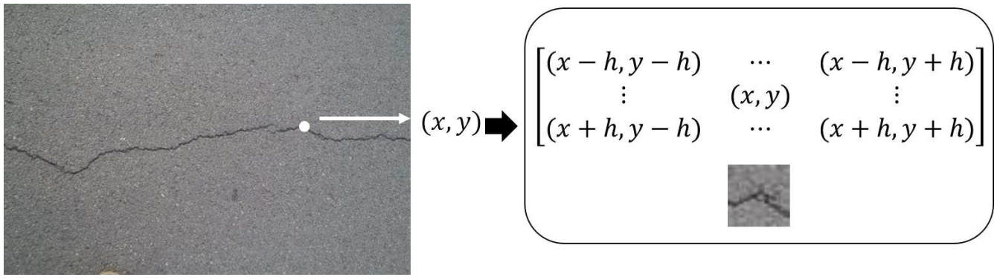

In [8]:
Image(filename="images/extracted_patch.PNG", width=400)

- According to the manually labeled **ground truth**, if the **center pixel** of the extracted patch is a **crack pixel**, the corresponding patch is a **positive sample** and vice versa.


- In a typical crack image, **non-crack pixels are a lot more common than crack pixels**. For a classification task with **imbalanced samples**, the proportion of positive and negative samples has a great impact on the network performance.


- To create a balanced dataset for training, **all positive samples are extracted first**. Then, **negative samples are extracted randomly according to the prescribed proportion**. Generally, the ratio of positive to negative samples is set to **1:3**.


- Below figure shows some **negative (left)** and **positive (right)** training patches extracted from the data set.

<!-- <img src = "images/negative_positive_samples.PNG" width = "400"> -->

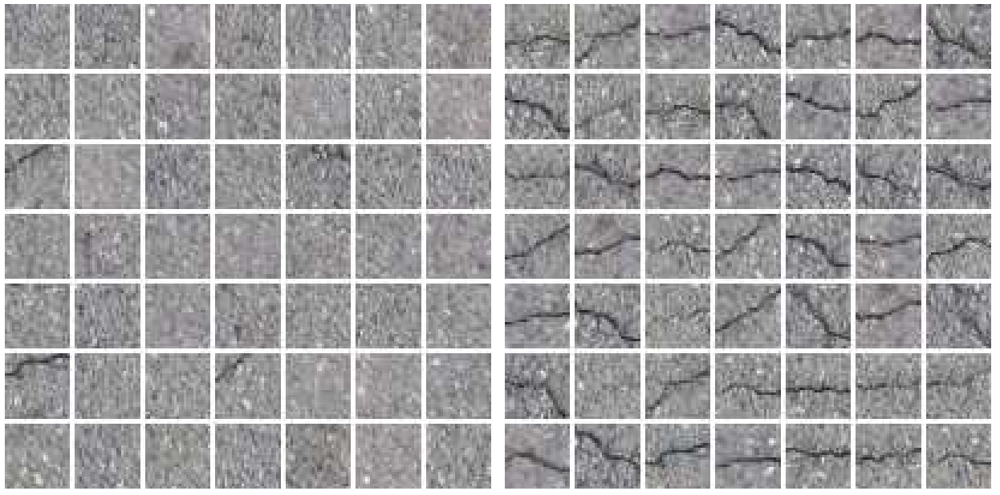

In [9]:
Image(filename="images/negative_positive_samples.PNG", width=500)

- **Symmetric padding** is applied to the boundaries of images so that every pixel has an associated **(27 x 27 x 3)** patch. Each image (320 x 480) has **153,600 pixels** and therefore **153,600 patches (or samples)**. However, we will NOT use all patches for training since we need to create a **balanced training set**, as explained above.


- Each **pixel intensity** is represented as a byte (0 to 255). We scale it to the **0-1 range**.

### Output Patch

<!-- <img src = "images/extracted_patch.PNG" width = "500"> -->

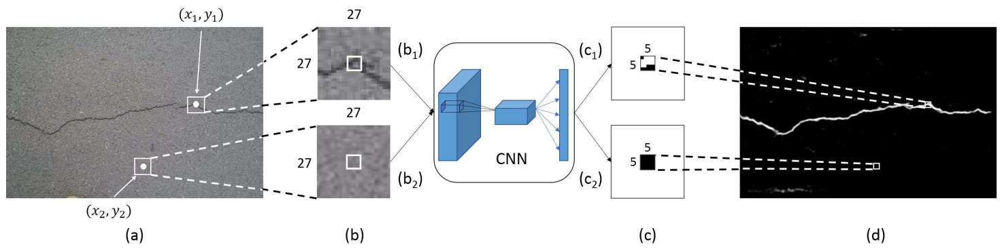

In [10]:
Image(filename="images/CNN_structured_prediction.PNG", width=900)

- (a) Two pixels of an image. $(x_1, y_1)$, $(x_2, y_2)$ are the coordinates of the pixels.
- (b) The extracted patches centered on the pixels. The size of the patches is 27 × 27.
- (c) The *structured predictions* of CNN given the input patches shown in (b). 
- (d) The probability map obtained by applying structured prediction on all pixels.

- The CNN outputs a <font color="red"> **structured patch ($s_{out}$ x $s_{out}$) centered in the input patch** </font>. 
    - The $s_{out}$ x $s_{out}$ patch is flattened into $s_{out}^2$ neurons in the output layer of the network. 
    - There are $s_{out}^2$ **ground truth labels** for each input patch of an image.
    - Thus, the structured prediction problem is a <font color="red"> **multilabel binary classification** </font> problem.
    - If $s_{out}=1$, it becomes a **single-pixel binary classification** problem.
    - A parameter $s$ is used to denote the number of pixels between the centered pixel and the boundary of the output patches. Thus, <font color="red"> $s_{out} = 2s + 1$ </font>

In [11]:
def get_shuffled(images,labels):
    """
        This function returns shuffled images and labels.
        
        params: 
            images: list, given images to be shuffled
            labels: list, given labels to be shuffled
        
        return:
            image_shuffled: list, shuffled images
            labels_shuffled: list, shuffled labels
    """
    num_img = len(images) # number of images
    range_num = list(range(num_img))
    for i in range(5):
        shuffle(range_num)

    image_shuffled, labels_shuffled = [],[]
    for i in range_num:
        image_shuffled.append(images[i])
        labels_shuffled.append(labels[i])

    return image_shuffled, labels_shuffled

In [12]:
def get_patch(image, seg_mask, flag_shuffle=True, ratio=3.0, h=13, s=2):
    """
        This function returns patches extracted from the given image and 
        corresponding structured labels extracted from the ground truth (image label). 
        The ratio of the number of negative patches to the number of 
        positive patches is prescribed by "ratio".
        
        params:
            image: np.array, given image
            seg_mask: np.array, ground truth (label) corresponding to the given image
            flag_shuffle: bool, indicates whether extracted patches and labels are shuffled
            ratio: float, the ratio of the number of negative patches to 
                    the number of positive patches
            h: int, input patch size = [2h+1, 2h+1], with the pixel at the center
            s: int, output patch size = [2s+1, 2s+1], with the pixel at the center
            
        return:
            patches: list, a list of patches with size [2h+1, 2h+1, 3] extracted from the given image
            labels: list, a list of target structured labels with size [(2s+1)^2,] extracted from the given ground truth
    """
    
    indices_pos = np.where(seg_mask == 1) # indices of positive pixels
    indices_neg = np.where(seg_mask == 0) # indices of negative pixels
    patches, labels = [], [] # for all patches and labels extracted from the given image
    
    ## Padding      
    img_paddings = tf.constant([[h,h], [h,h], [0,0]])
    img_tensor = tf.constant(image)
    image_pad = tf.pad(img_tensor, img_paddings, 'SYMMETRIC').numpy() # symmetric paddings to images
    
    label_paddings = tf.constant([[s,s], [s,s]])
    seg_mask = tf.constant(seg_mask)
    seg_mask_pad = tf.pad(seg_mask, label_paddings, 'CONSTANT').numpy() # zero paddings to labels
    
    # Positive input patches and output patches (structured labels)
    count, length = 0, len(indices_pos[0])
    for i,ind in enumerate(indices_pos[0]):
        x,y = ind, indices_pos[1][i]
        patches.append(image_pad[x:x+2*h+1, y:y+2*h+1])
        labels.append(seg_mask_pad[x:x+2*s+1, y:y+2*s+1].flatten())
        count+=1
            
    # Negative input patches and output patches (structured labels)
    no_negs = int(ratio*len(patches)) # number of negative patches
    count, length = 0, len(indices_neg[0])
    while count < no_negs:
        rand_int = randint(0, length)-1 # random index
        x, y = indices_neg[0][rand_int], indices_neg[1][rand_int]
        patches.append(image_pad[x:x+2*h+1, y:y+2*h+1])
        labels.append(seg_mask_pad[x:x+2*s+1, y:y+2*s+1].flatten())
        count+=1
        
    # Shuffle all patches and labels
    if flag_shuffle: 
        patches, labels = get_shuffled(patches, labels)
    
    return patches, labels

In [13]:
def load_data(image_path, label_path, file_id, flag_shuffle=True, ratio=3.0, h=13, s=2):
    """
        This function returns arrays that contain all patches
        extracted from images and corresponding labels extracted 
        from ground truth of all images with indices listed in "file_id"
        
        params:
            image_path: str, path to images
            label_path: str, path to ground truth (labels of images)
            file_id: list, a list of indices of images
            flag_shuffle: bool, indicates whether extracted patches and labels are shuffled
            ratio: float, the ratio of the number of negative patches to 
                    the number of positive patches
            h: int, input patch size = [2h+1, 2h+1], with the pixel at the center
            s: int, output patch size = [2s+1, 2s+1], with the pixel at the center
        
        return:
            all_patches: np.array, [num_patches, 2h+1, 2h+1, 3], all patches extracted from images with indices in file_id
            all_labels: np.array, [num_patches, (2s+1)^2], all structured label extracted from images with indices in file_id
    """
    
    label_files = os.listdir(label_path) # list of names of label files
    label_files_remained = [label_files[i] for i in file_id] # consider the instances prescribed in file_id   
    
    all_patches = np.empty((0,2*h+1,2*h+1,3))
    all_labels = np.empty((0,(2*s+1)**2))
    
    for label_file in label_files_remained: # loop over label_files
        image_file = label_file.split('.')[0]+'.jpg' # image file name
        img = mpimg.imread(os.path.join(image_path, image_file)) # load image data
        
        mat_contents = sio.loadmat(os.path.join(label_path, label_file)) # load corresponding label
        seg_mask = mat_contents['groundTruth'][0][0][0]
        seg_mask[seg_mask == 1] = 0
        seg_mask[seg_mask > 1] = 1
        
        # preprocess data to get input input patches and output patches (structured labels)
        patches, labels = get_patch(img, seg_mask, flag_shuffle=flag_shuffle, ratio=ratio, h=h, s=s) 
        all_patches = np.concatenate((all_patches, patches), axis = 0)
        all_labels = np.concatenate((all_labels, labels), axis = 0)
    
    return all_patches, all_labels

In [14]:
def plot_samples(image_path, label_path, sample_id):
    label_files = os.listdir(label_path)
    label_files_test = [label_files[i] for i in sample_id[:6]]

    fig = plt.figure(figsize=(18,8))
    for i, label_file in enumerate(label_files_test):
        image_file = label_file.split('.')[0] + '.jpg' # image file name
        img = mpimg.imread(os.path.join(image_path, image_file)) / 255.0

        mat_contents = sio.loadmat(os.path.join(label_path, label_file))
        seg_mask = mat_contents['groundTruth'][0][0][0] # segmentation of ground truth is extracted; boundary is not used
        seg_mask[seg_mask == 1] = 0
        seg_mask[seg_mask > 1] = 1

        label_temp = np.zeros_like(img, dtype='int32')
        for j in range(3):
            label_temp[:,:,j] = seg_mask
        img_label = np.hstack([img, label_temp])

        ax = fig.add_subplot(3,3,i+1)
        ax.imshow(img_label)
        ax.axis('off')
        ax.set_title('Sample {}'.format(label_file.split('.')[0]), fontsize=20)
    plt.tight_layout()
    plt.show()
    # plt.savefig('images\\train_samples.png')

**NOTE**: There are some inaccurate ground truth of some samples, as shown below, so they will be removed from the dataset.

In [15]:
# Samples to be removed
basepath = os.getcwd() # get the directory where the current notebook is located
label_path = os.path.join(basepath, 'data\\groundTruth') # the path to the ground truth folder
image_path = os.path.join(basepath, 'data\\image')       # the path to the image folder

removed_id = np.array([84, 85, 93, 97, 101, 102, 104, 108, 115])-1 # indices of samples to be excluded
label_files = os.listdir(label_path)
label_files_removed = [label_files[i] for i in removed_id]
print(label_files_removed)   

['084.mat', '085.mat', '093.mat', '097.mat', '101.mat', '102.mat', '104.mat', '108.mat', '115.mat']


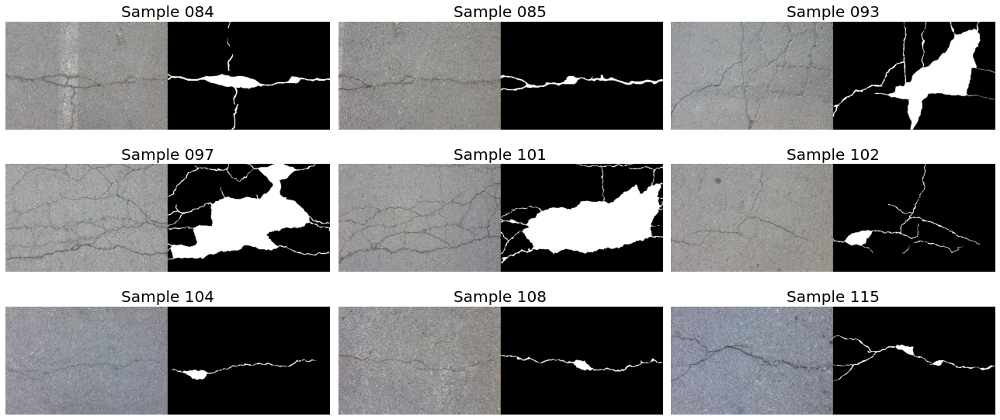

In [16]:
# Plot images and ground truth of the samples to be removed
fig = plt.figure(figsize=(18,8))
for i, label_file in enumerate(label_files_removed):
    image_file = label_file.split('.')[0] + '.jpg' # image file name
    img = mpimg.imread(os.path.join(image_path, image_file)) / 255.0
    
    mat_contents = sio.loadmat(os.path.join(label_path, label_file))
    seg_mask = mat_contents['groundTruth'][0][0][0] # segmentation of ground truth is extracted; boundary is not used
    seg_mask[seg_mask == 1] = 0
    seg_mask[seg_mask > 1] = 1
    
    label_temp = np.zeros_like(img, dtype='int32')
    for j in range(3):
        label_temp[:,:,j] = seg_mask
    img_label = np.hstack([img, label_temp])
    
    ax = fig.add_subplot(3,3,i+1)
    ax.imshow(img_label)
    ax.axis('off')
    ax.set_title('Sample {}'.format(label_file.split('.')[0]), fontsize=20)
plt.tight_layout()

In [17]:
# Indices of remaining samples in the data set
all_id = np.arange(118) # indices of all samples
remained_id = np.setdiff1d(all_id, removed_id) # indices of remaining samples in the data set
print(f'number of remaining samples: {len(remained_id)}\n indices: {remained_id}')

number of remaining samples: 109
 indices: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  85  86  87  88  89  90  91
  93  94  95  97  98  99 102 104 105 106 108 109 110 111 112 113 115 116
 117]


- We will randomly select **10 images (training)** and **3 images (testing)** from the remaining **109 images**. Corresponding ground truths are also selected. 


- **Input patches** and **target labels** for training and testing sets are generated from the selected images and ground truths. 


#### <font color="red"> $n_{train}=10$, $n_{test}=3$, $h=13$, $s=2$ </font>
- Input patch size: $[2h+1, 2h+1] = [27, 27]$


- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [5, 5]$

In [18]:
# Indices of training and testing instances
n_train = 10  # number of training samples
n_test = 3    # number of testing samples

train_id = np.array(sample(remained_id.tolist(),n_train)) # random samples for training
remained_id2 = np.setdiff1d(remained_id, train_id)

test_id = np.array(sample(remained_id2.tolist(),n_test))   # random samples for testing
remained_id2 = np.setdiff1d(remained_id2, test_id)

print(f"Number of Training samples: {train_id.size}")
print("  Indices: ", train_id+1)
print(f"Number of Testing samples: {test_id.size}")
print("  Indices: ", test_id+1)

Number of Training samples: 10
  Indices:  [74  8 77 59 32 83 23 61 30 21]
Number of Testing samples: 3
  Indices:  [103  19  94]


In [19]:
# Load training and testing sets
h = 13    # input patch size: [2h+1, 2h+1]
s = 2     # output patch size: [2s+1, 2s+1]
ratio = 3.0 # ratio of the number of negative samples to the number of positive samples

X_train, y_train = load_data(image_path, label_path, train_id, flag_shuffle=True, ratio=ratio, h=h, s=s)
X_test, y_test = load_data(image_path, label_path, test_id, flag_shuffle=False, ratio=ratio, h=h, s=s)
X_train /= 255.0 # scale pixel intensity to [0,1]
X_test /= 255.0  # scale pixel intensity to [0,1]
print(f'Training set: input shape: {X_train.shape}, output shape: {y_train.shape}')
print(f'testing set: input shape: {X_test.shape}, output shape: {y_test.shape}')

Training set: input shape: (109084, 27, 27, 3), output shape: (109084, 25)
testing set: input shape: (26500, 27, 27, 3), output shape: (26500, 25)


Training samples:


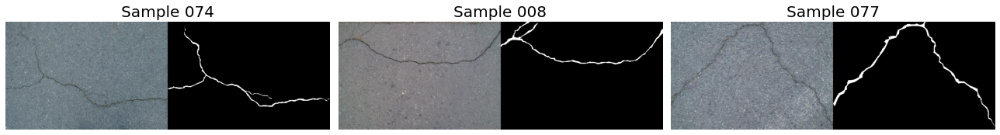

Testing samples:


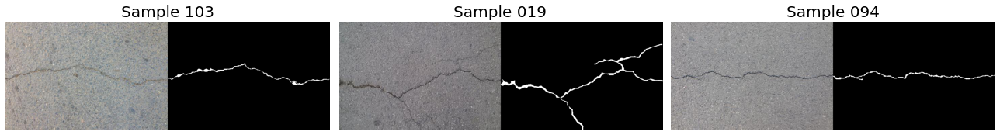

In [20]:
# Visualize images and ground truth in the Training set and the Testing set
basepath = os.getcwd() # get the directory where the current notebook is located
label_path = os.path.join(basepath, 'data', 'groundTruth') # the path to the ground truth folder
image_path = os.path.join(basepath, 'data', 'image')       # the path to the image folder

print('Training samples:')
plot_samples(image_path, label_path, train_id[:3])

print('Testing samples:')
plot_samples(image_path, label_path, test_id[:3])

## 2.2 CNN Architecture and Training

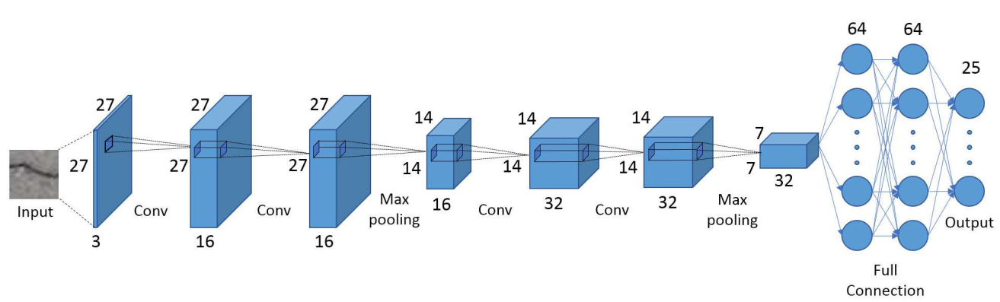

In [21]:
Image(filename="images/crack_cnn_architecture.PNG", width=800)

<!-- <img src = "images/crack_cnn_architecture.PNG" width = "800"> -->

- The CNN model contains **4 convolutional layers** with **2 max-pooling layers** and **3 fully connected (FC) layers**.


- All convolutional layers have a **kernel of 3 x 3** and a **stride of 1** with **zeros padding** to preserve the spatial resolution of resulting feature maps after convolution.


- **Max pooling** is performed with a **2 x 2 pool size** and a **stride of 2**.


- **Activation** functions:
    - Output layer: **Sigmoid** (binary classification)
    - All hidden layers: **ReLU**
    

- **Loss** function: **cross entroy**


- **Regularization**: control model flexibility to avoid overfitting
    - **Dropout** is applied to the first two fully-connected layers with a dropout ratio of 0.5

In [22]:
# Create a CNN model identical to the one proposed in the paper [1], without L2 penalty regularization
def model(h=13,s=2):
    """
        This function creates a CNN model.
        
        params: 
            h: int, input patch: [2h+1, 2h+1], with the pixel at the center
            s: int, output patch: [2s+1, 2s+1], with the pixel at the center
        
        return:
            model: tf.keras.sequential
    """
    model = keras.models.Sequential()
    
    # 1st Convolutional Layer: 16 feature maps, kernel size: 3x3, stride: 1, padding: zeros
    model.add(keras.layers.Conv2D(16, (3,3), strides=(1, 1), padding='same', activation='relu',
                                  input_shape=[2*h+1,2*h+1,3]))
    
    # 2nd Convolutional Layer: 16 feature maps, kernel size: 3x3, stride: 1, padding: zeros
    model.add(keras.layers.Conv2D(16, (3,3), strides=(1, 1), padding='same', activation='relu'))
    
    # Max Pooling Layer: window size: 2x2, stride: 2
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))
    
    # 3rd Convolutional Layer: 32 feature maps, kernel size: 3x3, stride: 1, padding: zeros
    model.add(keras.layers.Conv2D(32, (3,3), strides=(1, 1), padding='same', activation='relu'))
    
    # 4th Convolutional Layer: 32 feature maps, kernel size: 3x3, stride: 1, padding: zeros
    model.add(keras.layers.Conv2D(32, (3,3), strides=(1, 1), padding='same', activation='relu'))
    
    # Max Pooling Layer: window size: 2x2, stride: 2
    model.add(keras.layers.MaxPooling2D(pool_size=(2, 2)))

    # Fully Connected Layers
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(64, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense(64, activation='relu'))
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Dense((2*s+1)**2, activation='sigmoid'))
    return model

In [23]:
# Set Hyperparameters and Paths
optimizer = 'adam'
lr = 1e-3        # learning rate
epoch = 10       # number of training epochs
batch_size = 128 # batch size
folder_name = f'ntrain{n_train}_ntest{n_test}_Sout{2*s+1}'
savedir = os.path.join(basepath, 'output', folder_name) # directory for saving the trained model and outputs
os.makedirs(savedir, exist_ok=True)

In [24]:
# Instantiate and Compile a CNN model   
cnn = model(h=h, s=s)
cnn.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['binary_accuracy'])

In [25]:
# Train CNN; Use 20% training data as a validation set
time0 = time()
history = cnn.fit(X_train, y_train, batch_size=batch_size, epochs=epoch, validation_split=0.2)
print(f'training time: {(time()-time0)/60:.2f} mins')

Train on 87267 samples, validate on 21817 samples
Epoch 1/10
87267/87267 [==============================] - 18s 201us/sample - loss: 0.3327 - binary_accuracy: 0.8378 - val_loss: 0.3303 - val_binary_accuracy: 0.8113
Epoch 2/10
87267/87267 [==============================] - 18s 207us/sample - loss: 0.2234 - binary_accuracy: 0.8910 - val_loss: 0.2675 - val_binary_accuracy: 0.85790. - ETA: 2 - ETA: 0s - loss: 0.2237 - binary_accuracy:  - ETA: 0s - loss: 0.2236 - binary_accuracy: 
Epoch 3/10
87267/87267 [==============================] - 17s 189us/sample - loss: 0.2036 - binary_accuracy: 0.8995 - val_loss: 0.2598 - val_binary_accuracy: 0.8620
Epoch 4/10
87267/87267 [==============================] - 14s 164us/sample - loss: 0.1925 - binary_accuracy: 0.9061 - val_loss: 0.2680 - val_binary_accuracy: 0.8596
Epoch 5/10
87267/87267 [==============================] - 14s 161us/sample - loss: 0.1832 - binary_accuracy: 0.9106 - val_loss: 0.2478 - val_binary_accuracy: 0.8721
Epoch 6/10
87267/87267 [

In [26]:
# Save the trained model
# cnn.save(os.path.join(savedir, 'trained_model.h5'))

Saving figure Learning Curves


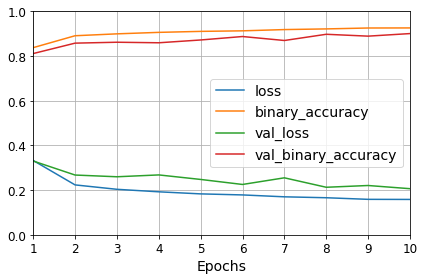

In [27]:
# Plot Learning Curves (hisotry of training and validation losses)
fig = plt.figure(figsize=(6,4))
for i in history.history.keys():
    plt.plot(np.arange(1,epoch+1), history.history[i], label=i)
plt.grid()
plt.xlim(1, epoch)
plt.ylim(0, 1)
plt.xlabel('Epochs')
plt.xticks(np.arange(1,epoch+1))
plt.legend(fontsize=14)
save_fig("Learning Curves")
plt.show()

In [28]:
# Evaluate the trained model on the Testing set
test_eval = cnn.evaluate(X_test, y_test)
print("\n Test loss: {:.8f}    Test accuracy: {:.8f}".format(test_eval[0], test_eval[1]))

26500/26500 [==============================] - 4s 151us/sample - loss: 0.1950 - binary_accuracy: 0.9105

 Test loss: 0.19497982    Test accuracy: 0.91053176


## 2.3 Crack Detection

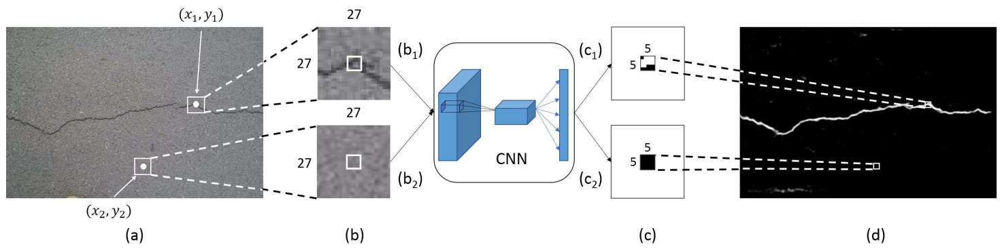

In [29]:
Image(filename="images/CNN_structured_prediction.PNG", width=900)

<!-- <img src = "images/CNN_structured_prediction.PNG" width = "900"> -->
- In testing, each pixel is used to generate an input patch, so **input patches overlap**, leading to **overlap of output patches ($s_{out}$ x $s_{out}$)**. The center coordinates of these output patches are corresponding pixel coordinates.


- Each pixel in a testing image has $s_{out}$ x $s_{out}$ predictions except for the boundary pixels. For a testing image, structured predictions of all pixels are **summed and normalized to [0,1]**. As a result, a <font color="red"> **probability map**</font> of an image is obtained, indicating the **probability of pixels being cracked**.
    - Note: **symmetric padding** is applied to boundaries of testing images


- Applying a **decision threshold** (50%), we can obtain the final **crack classification of all pixels** of an image.

The performance of the network on test images is evaluted by **precision**, **recall**, and **$F_1$** scores, which are commonly used in classification problems.

- **Precision**: percentage of how many predicted cracks are actually cracks, $\frac{TP}{TP + FP}$


- **Recall**: percentage of cracks detected, $\frac{TP}{TP + FN}$


- **$F_1$**: average of the precision and recall scores, $\frac{2 \times precision \times recall}{precision + recall} \in [0,1]$

where $TP$, $FP$, $FN$ are the numbers of **true positive**, **false positive**, and **false negative**, respectively.

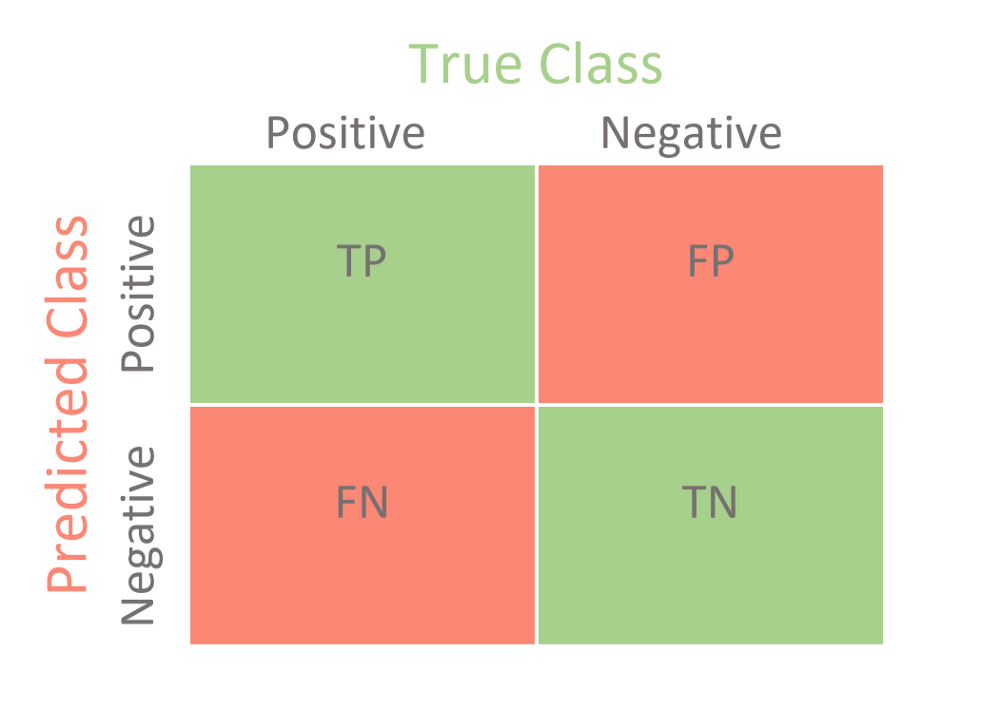

In [30]:
Image(filename="images/confusion_matrix.PNG", width=300)

In [31]:
def get_batches(image, h=13):
    """
        This function extract patches from the given image with 
        the patch size being [2h+1, 2h+1].
        
        params:
            image, np.arrays, given image
            h: int, input patch size: [2h+1, 2h+1], with the pixel at the center
            
        return:
            patches: np.arrays, extracted patches from the given image
    """
    m,n,p = image.shape
    patches = []
    for i in range(0,m):
        for j in range(0,n):
            if i-h-1 < 0 or j-h-1 < 0 or i+h+1 > m or j+h+1 > n:
                continue
            else:
                patches.append(image[i-h:i+h+1, j-h:j+h+1])
    return np.array(patches)


def infer(prediction, m, n, h=13, s=2):
    """
        This function sums up the structured outputs from s_out^2 units of 
        all pixels in an image. Note that the structured outputs of pixels
        can overlap.
        
        params:
            prediction: [num_pixels, num_output_units]
                        predictions from all s_out^2 output units of each pixel
            m: number of pixels in horizontal direction of original image
            n: number of pixels in vertical direction of original image
            h: int, input patch size: [2h+1, 2h+1], with the pixel at the center
            s: int, output patch size: [2s+1, 2s+1], with the pixel at the center
            
        return:
            array of image's original size that contains aggregate predictions
    """
    out = np.zeros((m,n), np.float32)
    count = 0
    for i in range(0,m):
        for j in range(0,n):
            if i-h-1 < 0 or j-h-1 < 0 or i+h+1 > m or j+h+1 > n:
                continue
            else:
                out[i-s:i+s+1,j-s:j+s+1] += prediction[count].reshape((2*s+1,2*s+1))
                count += 1
    return out[h:m-h,h:n-h]


def save_output(img, image_file, label, out_norm, save_path):
    """
        This function plots and saves figures: 
        original image, label, crack prediction image
        
        params:
            img: np.arrays, original image
            image_file: str, file name of the given image
            label: np.arrays, label of the original image
            out_norm: crack classification results
            save_path: path to save prediction images
    """
    out_channels = np.zeros_like(img)
    label_temp = np.zeros_like(img, dtype='int32')
    for i in range(3):
        out_channels[:,:,i] = out_norm
        label_temp[:,:,i] = label
        
    white_space = np.ones((img.shape[0],10,3), dtype='int32')
    save_image = np.hstack([img, white_space, label_temp, white_space, out_channels]) # stack arrays in sequence horizontally
    plt.figure(figsize=(12,6))
    plt.imshow(save_image)
    plt.axis("off")
    plt.savefig(os.path.join(save_path, image_file.replace('jpg','png')))
    plt.show()


def calc_precision_recall(ytrue, ypred):
    """
        This function calculates precision, recall, and F1 scores.
        
        params:
            ytrue: np.arrays, ground truth
            ypred: np.arrays, model prediction
        
        return:
            precision: float
            recall: float
            F1: float
    """
    true_pos = len(np.nonzero(np.logical_and(ytrue==ypred, ytrue==1))[0])
    true_neg = len(np.nonzero(np.logical_and(ytrue==ypred, ytrue==0))[0])
    false_pos = len(np.nonzero(np.logical_and(ytrue!=ypred, ytrue==0))[0])
    false_neg = len(np.nonzero(np.logical_and(ytrue!=ypred, ytrue==1))[0])
    
    precision = float(true_pos) / (true_pos+false_pos)
    recall = float(true_pos) / (true_pos+false_neg)
    F1 = float(2*precision*recall) / (precision+recall)
    
    return precision, recall, F1

In [32]:
def crack_pred(model, label_path, image_path, save_path, test_id, h=13, s=2):
    """
        This function uses the trained CNN model to perform crack prediction on testing samples.
        It plots and saves figures: original image + ground truth + crack prediction image
        
        params:
            model: tf.keras.sequential, the trained CNN model
            label_path: str, path to the ground truth
            image_path: str, path to the images
            save_path: str, path to save prediction images
            test_id: list, indices of testing instances
            h: int, input patch size: [2h+1, 2h+1]
            s: int, output patch size: [2s+1, 2s+1]
            
        return:
            precision: float, precision score
            recall: float, recall score
            F1: float, F1 score
    """
    label_files = os.listdir(label_path) # list of names of label files
    
    label_files_remained = [label_files[i] for i in test_id] # consider the instances prescribed in file_id
    paddings = tf.constant([[h,h], [h,h], [0,0]])

    tot_p, tot_r, tot_f = 0, 0, 0
    count = 0
    for label_file in label_files_remained:
        # Load the image of Test instance
        image_file = label_file.split('.')[0] + '.jpg'
        img = mpimg.imread(os.path.join(image_path, image_file)) / 255.0

        # Symmetric padding
        img_tensor = tf.constant(img)
        img1 = tf.pad(img_tensor, paddings, 'symmetric').numpy()
        m,n,p = img1.shape
        X_test = get_batches(img1, h=h) # patches extracted from an image

        # Load the label of Test instance
        mat_contents = sio.loadmat(os.path.join(label_path, label_file))
        seg_mask = mat_contents['groundTruth'][0][0][0]
        seg_mask[seg_mask == 1] = 0
        seg_mask[seg_mask > 1] = 1

        # Prediciton Results of Test instance
        total_prediction = model.predict(X_test)

        # Probability Map
        out = infer(total_prediction, m, n, h=h, s=s)
        out_norm = (out - out.min()) / out.max() # normalized to [0,1]

        # Crack prediction: decision threshold = 0.5
        # if predicted probability >= 0.5, it is a Crack pixel
        # if predicted probability < 0.5, it is a Non-Crack pixel
        out_norm[out_norm >= 0.5] = 1
        out_norm[out_norm < 0.5] = 0

        # Save figures
        save_output(img, image_file, seg_mask, out_norm, save_path)
        precision, recall, F1 = calc_precision_recall(seg_mask, out_norm)
        tot_p += precision 
        tot_r += recall
        tot_f += F1
        count += 1
    precision = tot_p/count
    recall = tot_r/count
    f1 = tot_f/count
    
    return precision, recall, f1

Training samples:


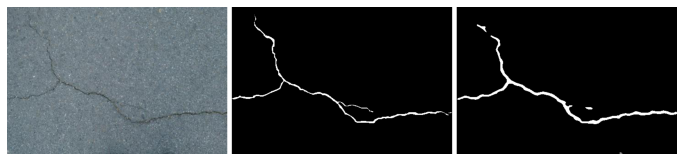

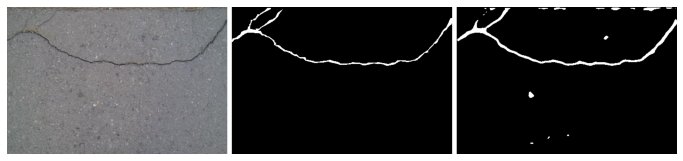

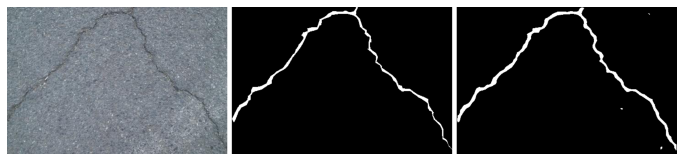

Average Training Precision: 0.59699004
Average Training Recall:    0.92167999
Average Training F1:        0.72232598


In [33]:
# Crack prediction on first 3 samples in the Training set by the trained model
fig_path = os.path.join(savedir, 'pred_train')
os.makedirs(fig_path, exist_ok=True)
print('Training samples:')
precision, recall, f1 = crack_pred(cnn, label_path, image_path, fig_path, train_id[:3], h=h, s=s)

print("Average Training Precision: {:0.8f}".format(precision))
print("Average Training Recall:    {:0.8f}".format(recall))
print("Average Training F1:        {:0.8f}".format(f1))

Testing samples:


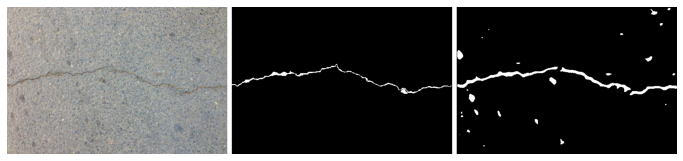

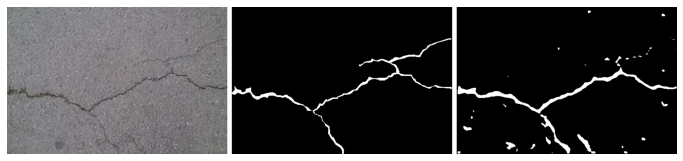

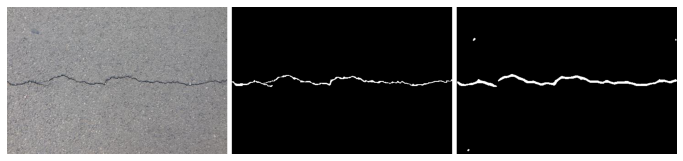

Average Testing Precision: 0.43250878
Average Testing Recall:    0.86232831
Average Testing F1:        0.56878599


In [34]:
# Crack prediction on Testing set by the trained model
fig_path = os.path.join(savedir, 'pred_test')
os.makedirs(fig_path, exist_ok=True)
print('Testing samples:')
precision, recall, f1 = crack_pred(cnn, label_path, image_path, fig_path, test_id[:3], h=h, s=s)

print("Average Testing Precision: {:0.8f}".format(precision))
print("Average Testing Recall:    {:0.8f}".format(recall))
print("Average Testing F1:        {:0.8f}".format(f1))

In [35]:
# Store precision, recall, and F1 score of testing samples
df_score = pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], index = [1], 
                        columns = ['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1'])
df_score.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,10,3,13,2,0.432509,0.862328,0.568786


## 2.4 Effects of Sizes of Training Data

In [36]:
def cnn_crack(train_id, test_id, h=13, s=2, ratio=3.0, lr=1e-3, epoch=5, batch_size=256, 
              optimizer='adam', plot_sample=True, save_model=False, plot_loss=True):
    """
        This function trains a CNN model and returns the precision and recall scores
        on the testing set of the trained model.
        
        params:
            train_id: np.array, indices of training samples
            test_id: np.array, indices of testing samples
            h: int, input patch size: [2h+1, 2h+1]
            s: int, output patch size: [2s+1, 2s+1]
            ratio: float, the ratio of the number of negative patches to 
                    the number of positive patches
        return:
            precision: float, precision score of testing set
            recall: float, recall score of testing set
    """
    n_train = train_id.size
    n_test = test_id.size
    
    # Set input and output paths
    basepath = os.getcwd() # get the directory where the current notebook is located
    label_path = os.path.join(basepath, 'data', 'groundTruth') # the path to the ground truth folder
    image_path = os.path.join(basepath, 'data', 'image')       # the path to the image folder

    folder_name = f'ntrain{n_train}_ntest{n_test}_Sout{2*s+1}'
    savedir = os.path.join(basepath, 'output', folder_name) # directory to save the trained model
    os.makedirs(savedir, exist_ok=True)
    fig_path = os.path.join(savedir, 'pred_train') # directory to save the predictions on training samples
    os.makedirs(fig_path, exist_ok=True)
    fig_path = os.path.join(savedir, 'pred_test')  # directory to save the predictions on testing samples
    os.makedirs(fig_path, exist_ok=True)

    ### Data Preprocessing ###
    # Load training and testing sets
    X_train, y_train = load_data(image_path, label_path, train_id, flag_shuffle=True, ratio=ratio, h=h, s=s)
    X_test, y_test = load_data(image_path, label_path, test_id, flag_shuffle=False, ratio=ratio, h=h, s=s)
    X_train /= 255.0 # scale pixel intensity to [0,1]
    X_test /= 255.0  # scale pixel intensity to [0,1]
    print(f'Training set: input shape: {X_train.shape}, output shape: {y_train.shape}')
    print(f'Testing set: input shape: {X_test.shape}, output shape: {y_test.shape}')

    # Visualize images and ground truth in the Training set and the Testing set
    if plot_sample:
        print('Training samples:')
        plot_samples(image_path, label_path, train_id[:3])
        print('Testing samples:')
        plot_samples(image_path, label_path, test_id[:3])
    
    ### CNN Training ###
    # Instantiate and Compile a CNN model   
    cnn = model(h=h, s=s)
    cnn.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['binary_accuracy'])

    # Train CNN; Use 20% training data as the validation set
    history = cnn.fit(X_train, y_train, batch_size=batch_size, epochs=epoch, validation_split=0.2)

    # Save the trained model
    if save_model:
        cnn.save(os.path.join(savedir, 'trained_model.h5'))

    # Plot Learning Curves (hisotry of training and validation loss)
    if plot_loss:
        fig = plt.figure(figsize=(6,4))
        for i in history.history.keys():
            plt.plot(np.arange(1,epoch+1), history.history[i], label=i)
        plt.grid()
        plt.xlim(1, epoch)
        plt.ylim(0, 1)
        plt.xlabel('Epochs')
        plt.xticks(np.arange(1,epoch+1))
        plt.legend(fontsize=14)
#         save_fig("Learning Curves")
        plt.show()

    # Evaluate the trained model on the Testing set
    test_eval = cnn.evaluate(X_test, y_test)
    print("\n Test loss: {:.8f}    Test accuracy: {:.8f}".format(test_eval[0], test_eval[1]))

    ### Crack Detection ###
    # Crack prediction on first 3 samples in the Training set by the trained model
    time1 = time()
    print('Prediction (Training samples):')
    train_pre, train_rec, train_f1 = crack_pred(cnn, label_path, image_path, fig_path, train_id[:3], h=h, s=s)

    # Crack prediction on first 3 samples in the Testing set by the trained model
    print('Prediction (Testing samples):')
    test_pre, test_rec, test_f1 = crack_pred(cnn, label_path, image_path, fig_path, test_id[:3], h=h, s=s)
    print(f'evaluation time: {(time()-time1)/60:.2f} mins')
    
    print("Average Testing Precision: {:0.8f}".format(test_pre))
    print("Average Testing Recall:    {:0.8f}".format(test_rec))
    print("Average Testing F1:        {:0.8f}".format(test_f1))
    return test_pre, test_rec, test_f1

#### <font color="red"> $h=13$, $s=2$ </font>
- Input patch size: $[2h+1, 2h+1] = [27, 27]$
- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [5, 5]$

#### <font color="red"> $n_{train}=20$, $n_{test}=3$ </font>

Number of Training samples: 20
[ 74   8  77  59  32  83  23  61  30  21  65  78  79  10  82 117  72  51
  43 112]
Number of Testing samples: 3
[103  19  94]
Training set: input shape: (186860, 27, 27, 3), output shape: (186860, 25)
Testing set: input shape: (26500, 27, 27, 3), output shape: (26500, 25)
Training samples:


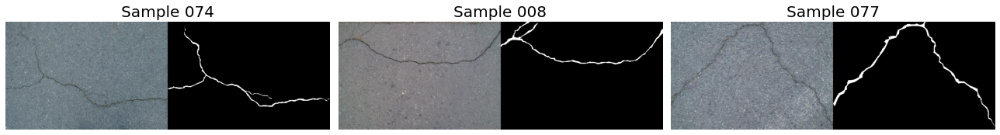

Testing samples:


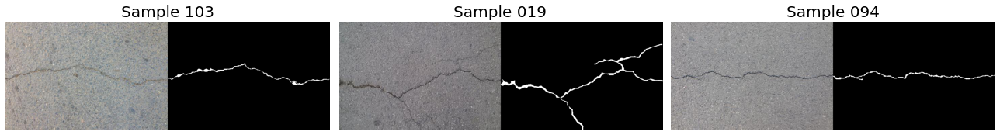

Train on 149488 samples, validate on 37372 samples
Epoch 1/10
149488/149488 [==============================] - 22s 147us/sample - loss: 0.2809 - binary_accuracy: 0.8676 - val_loss: 0.2684 - val_binary_accuracy: 0.8946
Epoch 2/10
149488/149488 [==============================] - 22s 149us/sample - loss: 0.2198 - binary_accuracy: 0.8983 - val_loss: 0.2525 - val_binary_accuracy: 0.8921
Epoch 3/10
149488/149488 [==============================] - 24s 161us/sample - loss: 0.1992 - binary_accuracy: 0.9082 - val_loss: 0.1782 - val_binary_accuracy: 0.9202
Epoch 4/10
149488/149488 [==============================] - 20s 133us/sample - loss: 0.1863 - binary_accuracy: 0.9147 - val_loss: 0.1867 - val_binary_accuracy: 0.9153
Epoch 5/10
149488/149488 [==============================] - 19s 124us/sample - loss: 0.1774 - binary_accuracy: 0.9190 - val_loss: 0.2052 - val_binary_accuracy: 0.9096
Epoch 6/10
149488/149488 [==============================] - 20s 132us/sample - loss: 0.1685 - binary_accuracy: 0.9

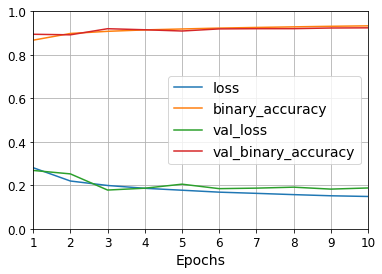

26500/26500 [==============================] - 4s 140us/sample - loss: 0.1610 - binary_accuracy: 0.9259

 Test loss: 0.16104307    Test accuracy: 0.92591769
Prediction (Training samples):


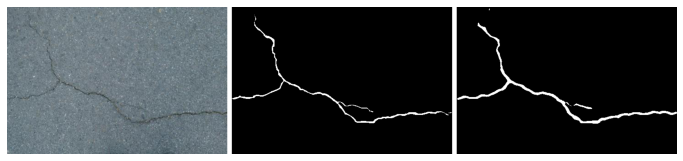

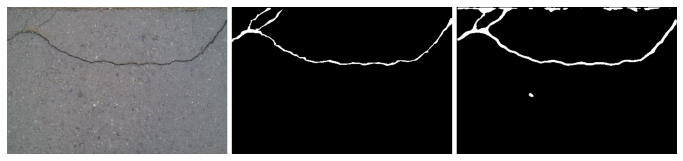

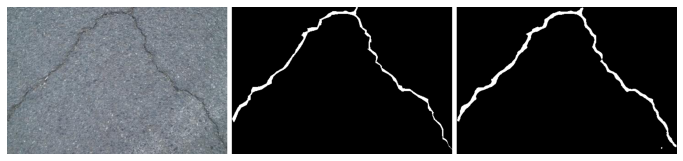

Prediction (Testing samples):


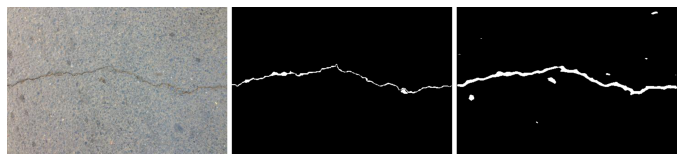

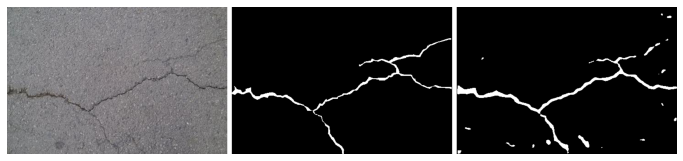

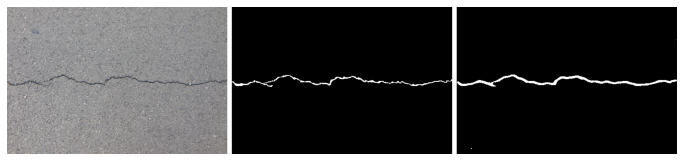

evaluation time: 1.68 mins
Average Testing Precision: 0.49944892
Average Testing Recall:    0.91018138
Average Testing F1:        0.63954559


In [37]:
# Additional random samples for training, use the same testing samples as before
n_train2 = 10
train_id2 = np.array(sample(remained_id2.tolist(),n_train2))
remained_id2 = np.setdiff1d(remained_id2, train_id2)
train_id = np.concatenate((train_id[:,None], train_id2[:,None]), axis=0).squeeze()

print(f"Number of Training samples: {train_id.size}")
print(train_id+1)
print(f"Number of Testing samples: {test_id.size}")
print(test_id+1)

precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=128, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [38]:
df_score = df_score.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                        index=[df_score.shape[0]+1], 
                                        columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,10,3,13,2,0.432509,0.862328,0.568786
2,20,3,13,2,0.499449,0.910181,0.639546


#### <font color="red"> $n_{train}=30$, $n_{test}=3$ </font>

Number of Training samples: 30
[ 74   8  77  59  32  83  23  61  30  21  65  78  79  10  82 117  72  51
  43 112  66  37   3  80  13  52  99  18   5  47]
Number of Testing samples: 3
[103  19  94]
Training set: input shape: (285104, 27, 27, 3), output shape: (285104, 25)
Testing set: input shape: (26500, 27, 27, 3), output shape: (26500, 25)
Training samples:


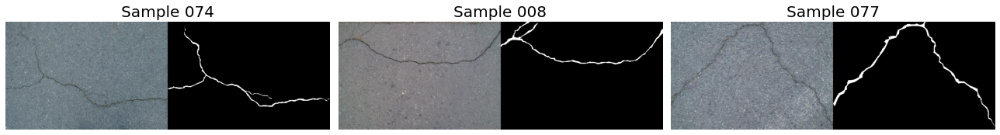

Testing samples:


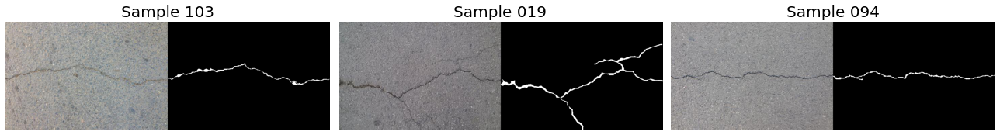

Train on 228083 samples, validate on 57021 samples
Epoch 1/10
228083/228083 [==============================] - 30s 131us/sample - loss: 0.2660 - binary_accuracy: 0.8730 - val_loss: 0.2267 - val_binary_accuracy: 0.9032
Epoch 2/10
228083/228083 [==============================] - 27s 119us/sample - loss: 0.2082 - binary_accuracy: 0.9015 - val_loss: 0.2095 - val_binary_accuracy: 0.9114
Epoch 3/10
228083/228083 [==============================] - 27s 118us/sample - loss: 0.1908 - binary_accuracy: 0.9101 - val_loss: 0.1975 - val_binary_accuracy: 0.9151
Epoch 4/10
228083/228083 [==============================] - 27s 119us/sample - loss: 0.1796 - binary_accuracy: 0.9152 - val_loss: 0.2104 - val_binary_accuracy: 0.9207
Epoch 5/10
228083/228083 [==============================] - 27s 121us/sample - loss: 0.1718 - binary_accuracy: 0.9195 - val_loss: 0.2211 - val_binary_accuracy: 0.9194
Epoch 6/10
228083/228083 [==============================] - 27s 120us/sample - loss: 0.1642 - binary_accuracy: 0.9

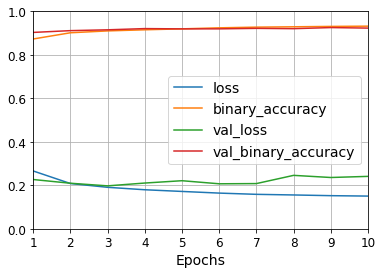

26500/26500 [==============================] - 3s 131us/sample - loss: 0.1807 - binary_accuracy: 0.9242

 Test loss: 0.18066953    Test accuracy: 0.92424327
Prediction (Training samples):


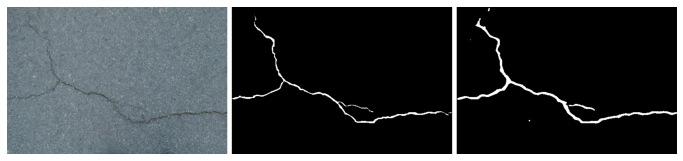

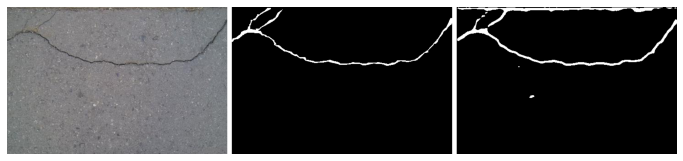

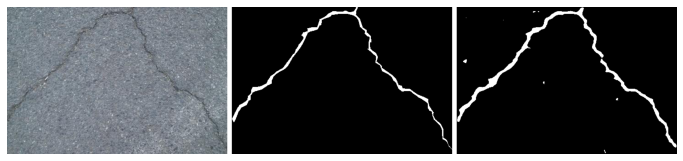

Prediction (Testing samples):


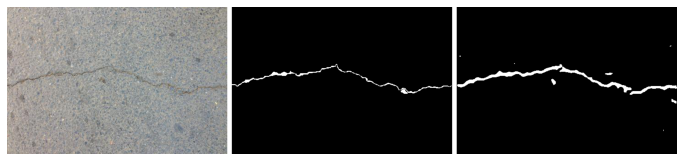

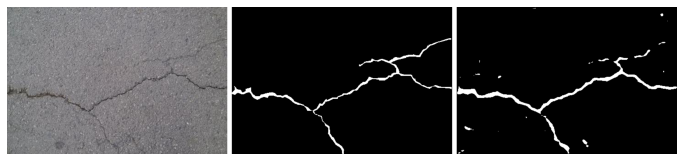

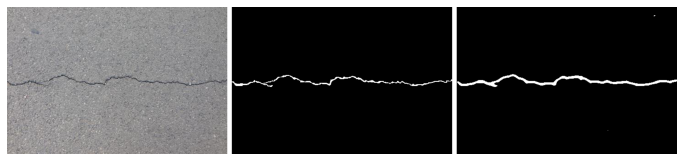

evaluation time: 1.71 mins
Average Testing Precision: 0.51094898
Average Testing Recall:    0.90934488
Average Testing F1:        0.64556902
training time: 7.18 mins


In [39]:
# Additional random samples for training, use the same testing samples as before
n_train2 = 10
train_id2 = np.array(sample(remained_id2.tolist(),n_train2))
remained_id2 = np.setdiff1d(remained_id2, train_id2)
train_id = np.concatenate((train_id[:,None], train_id2[:,None]), axis=0).squeeze()

print(f"Number of Training samples: {train_id.size}")
print(train_id+1)
print(f"Number of Testing samples: {test_id.size}")
print(test_id+1)

time0 = time()
precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=128, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)
print(f'training time: {(time()-time0)/60:.2f} mins')

In [40]:
df_score = df_score.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                        index=[df_score.shape[0]+1], 
                                        columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,10,3,13,2,0.432509,0.862328,0.568786
2,20,3,13,2,0.499449,0.910181,0.639546
3,30,3,13,2,0.510949,0.909345,0.645569


#### <font color="red"> $n_{train}=10$, $n_{test}=3$ </font>

Number of Training samples: 40
[ 74   8  77  59  32  83  23  61  30  21  65  78  79  10  82 117  72  51
  43 112  66  37   3  80  13  52  99  18   5  47  58  86  38  34  70  40
  53  49 105  14]
Number of Testing samples: 3
[103  19  94]
Training set: input shape: (349576, 27, 27, 3), output shape: (349576, 25)
Testing set: input shape: (26500, 27, 27, 3), output shape: (26500, 25)
Training samples:


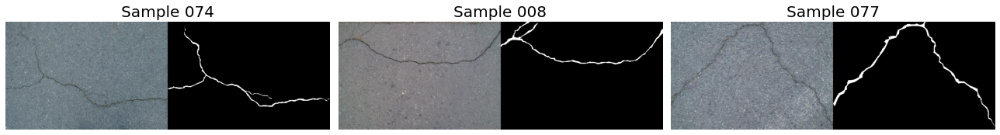

Testing samples:


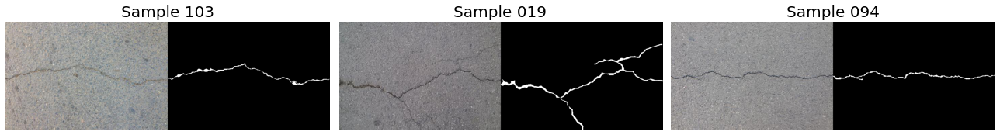

Train on 279660 samples, validate on 69916 samples
Epoch 1/10
279660/279660 [==============================] - 37s 132us/sample - loss: 0.2602 - binary_accuracy: 0.8762 - val_loss: 0.2316 - val_binary_accuracy: 0.8968
Epoch 2/10
279660/279660 [==============================] - 33s 118us/sample - loss: 0.2001 - binary_accuracy: 0.9068 - val_loss: 0.2401 - val_binary_accuracy: 0.9042
Epoch 3/10
279660/279660 [==============================] - 33s 119us/sample - loss: 0.1811 - binary_accuracy: 0.9163 - val_loss: 0.2276 - val_binary_accuracy: 0.9078
Epoch 4/10
279660/279660 [==============================] - 33s 119us/sample - loss: 0.1686 - binary_accuracy: 0.9243 - val_loss: 0.2243 - val_binary_accuracy: 0.9137
Epoch 5/10
279660/279660 [==============================] - 34s 121us/sample - loss: 0.1605 - binary_accuracy: 0.9291 - val_loss: 0.2659 - val_binary_accuracy: 0.9157
Epoch 6/10
279660/279660 [==============================] - 34s 122us/sample - loss: 0.1554 - binary_accuracy: 0.9

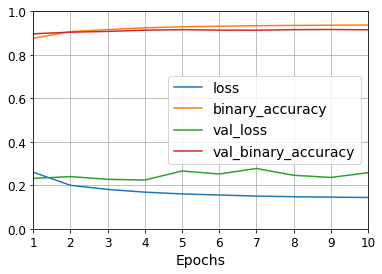

26500/26500 [==============================] - 3s 126us/sample - loss: 0.1700 - binary_accuracy: 0.9302

 Test loss: 0.16999831    Test accuracy: 0.93021750
Prediction (Training samples):


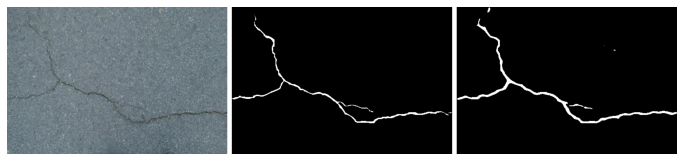

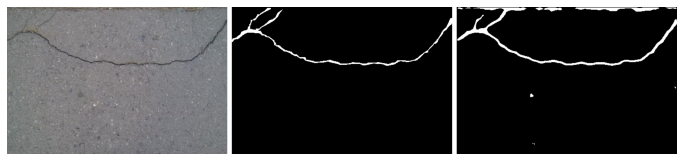

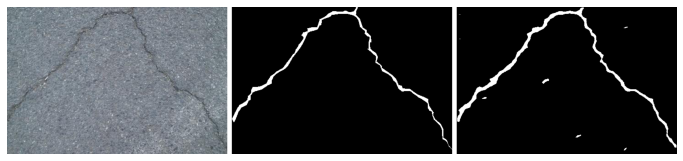

Prediction (Testing samples):


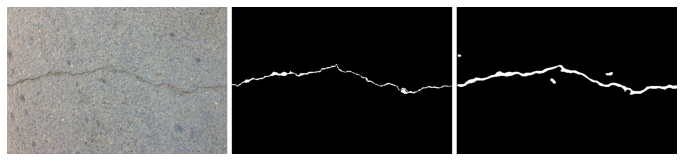

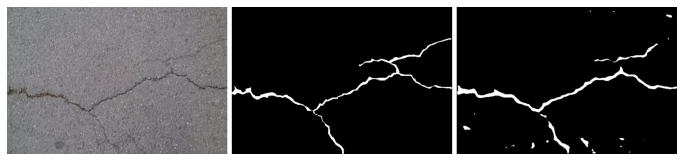

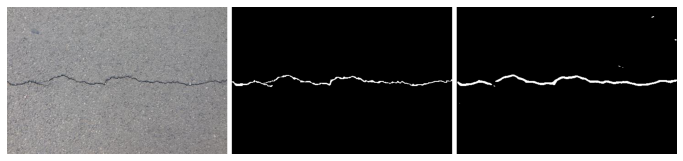

evaluation time: 1.76 mins
Average Testing Precision: 0.54039611
Average Testing Recall:    0.89271432
Average Testing F1:        0.66826215


In [41]:
# Additional random samples for training, use the same testing samples as before
n_train2 = 10
train_id2 = np.array(sample(remained_id2.tolist(),n_train2))
remained_id2 = np.setdiff1d(remained_id2, train_id2)
train_id = np.concatenate((train_id[:,None], train_id2[:,None]), axis=0).squeeze()

print(f"Number of Training samples: {train_id.size}")
print(train_id+1)
print(f"Number of Testing samples: {test_id.size}")
print(test_id+1)

precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=128, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [42]:
df_score = df_score.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                        index=[df_score.shape[0]+1], 
                                        columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,10,3,13,2,0.432509,0.862328,0.568786
2,20,3,13,2,0.499449,0.910181,0.639546
3,30,3,13,2,0.510949,0.909345,0.645569
4,40,3,13,2,0.540396,0.892714,0.668262


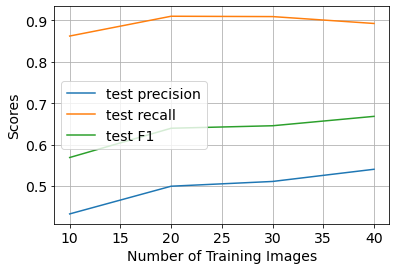

In [43]:
# Plot testing scores
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111)
ax.plot(df_score.iloc[:,0], df_score.iloc[:,4], label='test precision')
ax.plot(df_score.iloc[:,0], df_score.iloc[:,5], label='test recall')
ax.plot(df_score.iloc[:,0], df_score.iloc[:,6], label='test F1')
ax.grid()
ax.set_xlabel('Number of Training Images', fontsize=14)
ax.set_ylabel('Scores', fontsize=14)
ax.tick_params(labelsize=14)
ax.legend(fontsize=14)

# 3. Exercises

## 3.1 Effects of Output Structures

In [44]:
np.random.seed(111)
tf.random.set_seed(111)
random.seed(111)

# Random indices of trianing and testing samples
n_train = 1
n_test = 1
train_id = np.array(sample(remained_id.tolist(),n_train)) # random samples for training
test_id = np.array(sample(np.setdiff1d(remained_id, train_id).tolist(),n_test))   # random samples for testing
print("Indices of Training samples: ", train_id+1)
print("Indices of Testing samples: ", test_id+1)

Indices of Training samples:  [114]
Indices of Testing samples:  [28]


#### <font color="red"> $h=13$, $s=0$ </font>
- Input patch size: $[2h+1, 2h+1] = [27, 27]$
- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [1, 1]$

Training set: input shape: (6556, 27, 27, 3), output shape: (6556, 1)
Testing set: input shape: (10848, 27, 27, 3), output shape: (10848, 1)
Training samples:


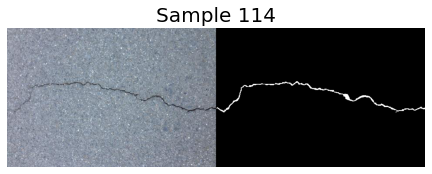

Testing samples:


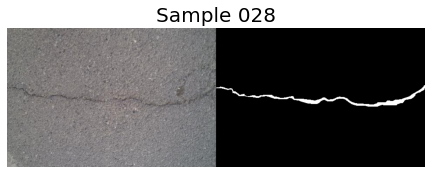

Train on 5244 samples, validate on 1312 samples
Epoch 1/10
5244/5244 [==============================] - 3s 561us/sample - loss: 0.5291 - binary_accuracy: 0.7487 - val_loss: 0.2945 - val_binary_accuracy: 0.9139
Epoch 2/10
5244/5244 [==============================] - 1s 171us/sample - loss: 0.2340 - binary_accuracy: 0.9178 - val_loss: 0.1299 - val_binary_accuracy: 0.9581
Epoch 3/10
5244/5244 [==============================] - 1s 170us/sample - loss: 0.1564 - binary_accuracy: 0.9563 - val_loss: 0.1012 - val_binary_accuracy: 0.9642
Epoch 4/10
5244/5244 [==============================] - 1s 171us/sample - loss: 0.1261 - binary_accuracy: 0.9659 - val_loss: 0.0756 - val_binary_accuracy: 0.9756
Epoch 5/10
5244/5244 [==============================] - 1s 170us/sample - loss: 0.1020 - binary_accuracy: 0.9716 - val_loss: 0.0724 - val_binary_accuracy: 0.9741
Epoch 6/10
5244/5244 [==============================] - 1s 171us/sample - loss: 0.0851 - binary_accuracy: 0.9758 - val_loss: 0.0545 - val_bina

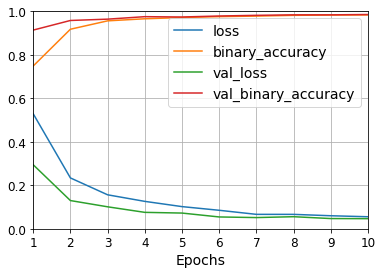

10848/10848 [==============================] - 1s 122us/sample - loss: 0.4820 - binary_accuracy: 0.8847

 Test loss: 0.48195779    Test accuracy: 0.88467920
Prediction (Training samples):


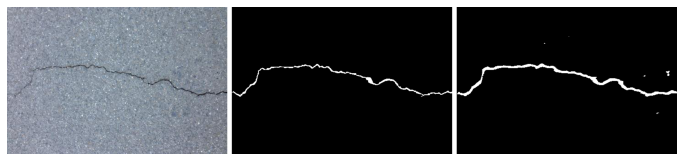

Prediction (Testing samples):


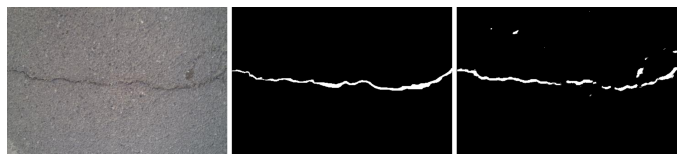

evaluation time: 0.56 mins
Average Testing Precision: 0.53536755
Average Testing Recall:    0.56932153
Average Testing F1:        0.55182273


In [45]:
h = 13
s = 0
precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=64, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [46]:
# Store precision, recall, and F1 score of testing samples
df_score2 = pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], index = [1], 
                         columns = ['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1'])
df_score2.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,1,1,13,0,0.535368,0.569322,0.551823


#### <font color="red"> $h=13$, $s=1$ </font>
- Input patch size: $[2h+1, 2h+1] = [27, 27]$
- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [3, 3]$

Training set: input shape: (6556, 27, 27, 3), output shape: (6556, 9)
Testing set: input shape: (10848, 27, 27, 3), output shape: (10848, 9)
Training samples:


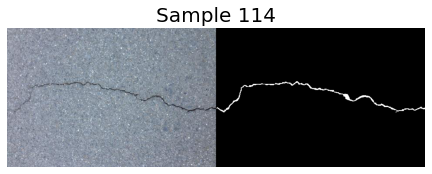

Testing samples:


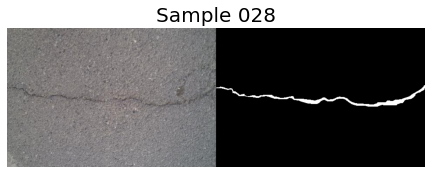

Train on 5244 samples, validate on 1312 samples
Epoch 1/10
5244/5244 [==============================] - 2s 408us/sample - loss: 0.5388 - binary_accuracy: 0.7402 - val_loss: 0.2912 - val_binary_accuracy: 0.8169
Epoch 2/10
5244/5244 [==============================] - 1s 170us/sample - loss: 0.3012 - binary_accuracy: 0.8519 - val_loss: 0.2116 - val_binary_accuracy: 0.9087
Epoch 3/10
5244/5244 [==============================] - 1s 168us/sample - loss: 0.2291 - binary_accuracy: 0.9013 - val_loss: 0.1805 - val_binary_accuracy: 0.9243
Epoch 4/10
5244/5244 [==============================] - 1s 170us/sample - loss: 0.1919 - binary_accuracy: 0.9165 - val_loss: 0.1571 - val_binary_accuracy: 0.9286
Epoch 5/10
5244/5244 [==============================] - 1s 169us/sample - loss: 0.1750 - binary_accuracy: 0.9217 - val_loss: 0.1630 - val_binary_accuracy: 0.9280
Epoch 6/10
5244/5244 [==============================] - 1s 171us/sample - loss: 0.1678 - binary_accuracy: 0.9277 - val_loss: 0.1337 - val_bina

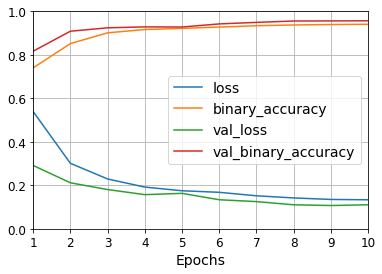

10848/10848 [==============================] - 1s 121us/sample - loss: 0.2224 - binary_accuracy: 0.9221

 Test loss: 0.22235160    Test accuracy: 0.92214614
Prediction (Training samples):


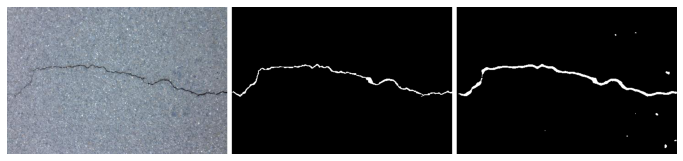

Prediction (Testing samples):


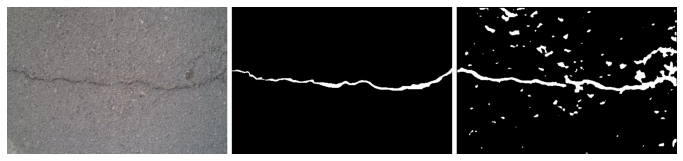

evaluation time: 0.54 mins
Average Testing Precision: 0.25089900
Average Testing Recall:    0.90044248
Average Testing F1:        0.39244677


In [47]:
h = 13
s = 1
precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=64, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [48]:
df_score2 = df_score2.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                          index=[df_score2.shape[0]+1], 
                                          columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score2.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,1,1,13,0,0.535368,0.569322,0.551823
2,1,1,13,1,0.250899,0.900442,0.392447


#### <font color="red"> $h=13$, $s=2$ </font>
- Input patch size: $[2h+1, 2h+1] = [27, 27]$
- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [5, 5]$

Training set: input shape: (6556, 27, 27, 3), output shape: (6556, 25)
Testing set: input shape: (10848, 27, 27, 3), output shape: (10848, 25)
Training samples:


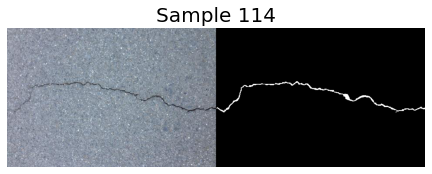

Testing samples:


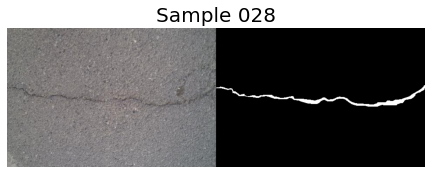

Train on 5244 samples, validate on 1312 samples
Epoch 1/10
5244/5244 [==============================] - 3s 531us/sample - loss: 0.4717 - binary_accuracy: 0.7833 - val_loss: 0.2748 - val_binary_accuracy: 0.8529
Epoch 2/10
5244/5244 [==============================] - 1s 166us/sample - loss: 0.2549 - binary_accuracy: 0.8504 - val_loss: 0.2142 - val_binary_accuracy: 0.8648
Epoch 3/10
5244/5244 [==============================] - 1s 167us/sample - loss: 0.2345 - binary_accuracy: 0.8755 - val_loss: 0.2045 - val_binary_accuracy: 0.8920
Epoch 4/10
5244/5244 [==============================] - 1s 171us/sample - loss: 0.2118 - binary_accuracy: 0.8958 - val_loss: 0.1865 - val_binary_accuracy: 0.9049
Epoch 5/10
5244/5244 [==============================] - 1s 185us/sample - loss: 0.1968 - binary_accuracy: 0.9024 - val_loss: 0.1791 - val_binary_accuracy: 0.9083
Epoch 6/10
5244/5244 [==============================] - 1s 185us/sample - loss: 0.1863 - binary_accuracy: 0.9055 - val_loss: 0.1685 - val_bina

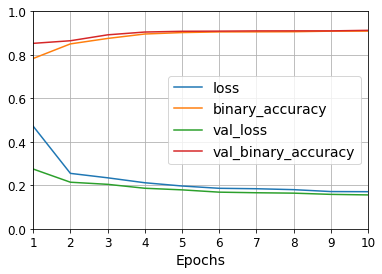

10848/10848 [==============================] - 1s 121us/sample - loss: 0.3761 - binary_accuracy: 0.8584

 Test loss: 0.37605858    Test accuracy: 0.85844743
Prediction (Training samples):


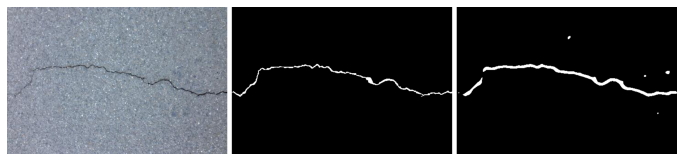

Prediction (Testing samples):


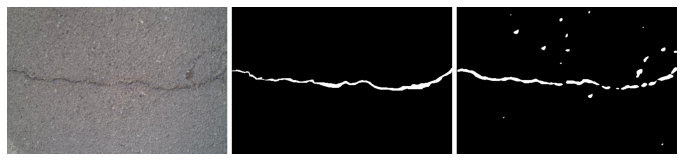

evaluation time: 0.53 mins
Average Testing Precision: 0.49311456
Average Testing Recall:    0.62057522
Average Testing F1:        0.54955102


In [49]:
h = 13
s = 2
precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=64, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [50]:
df_score2 = df_score2.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                          index=[df_score2.shape[0]+1], 
                                          columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score2.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,1,1,13,0,0.535368,0.569322,0.551823
2,1,1,13,1,0.250899,0.900442,0.392447
3,1,1,13,2,0.493115,0.620575,0.549551


#### <font color="red"> $h=13$, $s=3$ </font>
- Input patch size: $[2h+1, 2h+1] = [27, 27]$
- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [7, 7]$

Training set: input shape: (6556, 27, 27, 3), output shape: (6556, 49)
Testing set: input shape: (10848, 27, 27, 3), output shape: (10848, 49)
Training samples:


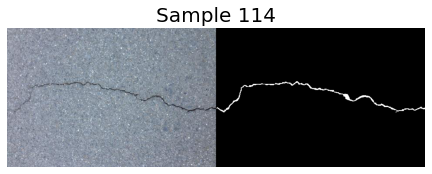

Testing samples:


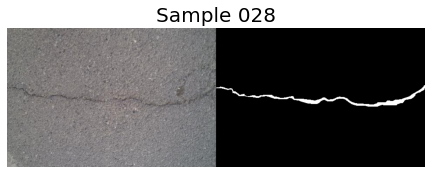

Train on 5244 samples, validate on 1312 samples
Epoch 1/10
5244/5244 [==============================] - 2s 416us/sample - loss: 0.4762 - binary_accuracy: 0.7920 - val_loss: 0.2893 - val_binary_accuracy: 0.8790
Epoch 2/10
5244/5244 [==============================] - 1s 165us/sample - loss: 0.2902 - binary_accuracy: 0.8793 - val_loss: 0.2151 - val_binary_accuracy: 0.8847
Epoch 3/10
5244/5244 [==============================] - 1s 168us/sample - loss: 0.2256 - binary_accuracy: 0.8939 - val_loss: 0.1839 - val_binary_accuracy: 0.9096
Epoch 4/10
5244/5244 [==============================] - 1s 168us/sample - loss: 0.1983 - binary_accuracy: 0.9052 - val_loss: 0.1758 - val_binary_accuracy: 0.9101
Epoch 5/10
5244/5244 [==============================] - 1s 166us/sample - loss: 0.1880 - binary_accuracy: 0.9086 - val_loss: 0.1654 - val_binary_accuracy: 0.9159
Epoch 6/10
5244/5244 [==============================] - 1s 179us/sample - loss: 0.1753 - binary_accuracy: 0.9115 - val_loss: 0.1582 - val_bina

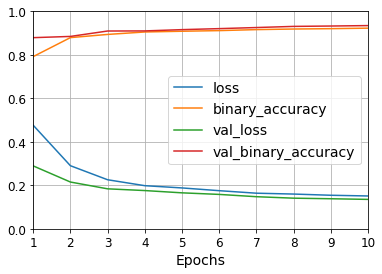

10848/10848 [==============================] - 1s 120us/sample - loss: 0.2275 - binary_accuracy: 0.8818

 Test loss: 0.22751944    Test accuracy: 0.88179308
Prediction (Training samples):


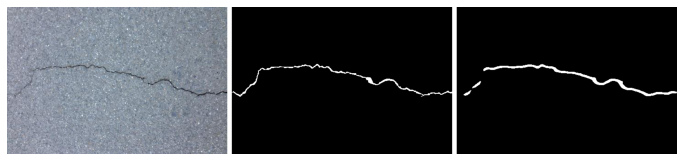

Prediction (Testing samples):


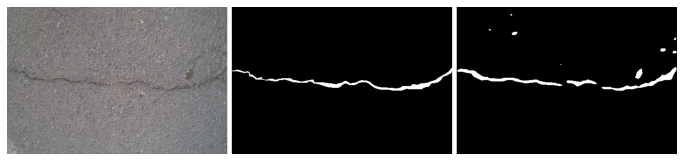

evaluation time: 0.54 mins
Average Testing Precision: 0.54881974
Average Testing Recall:    0.75442478
Average Testing F1:        0.63540373


In [51]:
h = 13
s = 3
precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=64, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [52]:
df_score2 = df_score2.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                          index=[df_score2.shape[0]+1], 
                                          columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score2.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,1,1,13,0,0.535368,0.569322,0.551823
2,1,1,13,1,0.250899,0.900442,0.392447
3,1,1,13,2,0.493115,0.620575,0.549551
4,1,1,13,3,0.548820,0.754425,0.635404


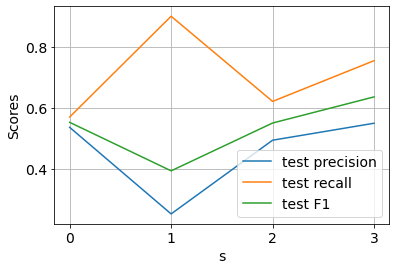

In [53]:
# Plot testing scores
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111)
ax.plot(df_score2.iloc[:,3], df_score2.iloc[:,4], label='test precision')
ax.plot(df_score2.iloc[:,3], df_score2.iloc[:,5], label='test recall')
ax.plot(df_score2.iloc[:,3], df_score2.iloc[:,6], label='test F1')
ax.grid()
ax.set_xlabel('s', fontsize=14)
ax.set_ylabel('Scores', fontsize=14)
ax.set_xticks(df_score2.iloc[:,3])
ax.tick_params(labelsize=14)
ax.legend(fontsize=14)

## 3.2 Effects of Input Structures

In [54]:
# Store precision, recall, and F1 score of testing samples
df_score3 = pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], index = [1], 
                         columns = ['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1'])
df_score3.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,1,1,13,3,0.54882,0.754425,0.635404


#### <font color="red"> $h=9$, $s=3$ </font>
- Input patch size: $[2h+1, 2h+1] = [19, 19]$
- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [7, 7]$

Training set: input shape: (6556, 19, 19, 3), output shape: (6556, 49)
Testing set: input shape: (10848, 19, 19, 3), output shape: (10848, 49)
Training samples:


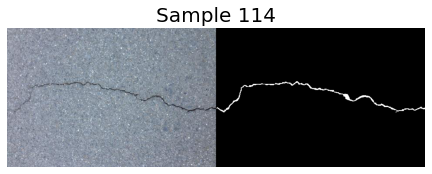

Testing samples:


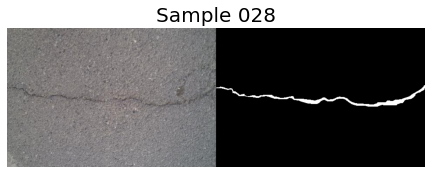

Train on 5244 samples, validate on 1312 samples
Epoch 1/10
5244/5244 [==============================] - 3s 485us/sample - loss: 0.4696 - binary_accuracy: 0.7937 - val_loss: 0.3062 - val_binary_accuracy: 0.8696
Epoch 2/10
5244/5244 [==============================] - 1s 130us/sample - loss: 0.2668 - binary_accuracy: 0.8834 - val_loss: 0.2186 - val_binary_accuracy: 0.8858
Epoch 3/10
5244/5244 [==============================] - 1s 132us/sample - loss: 0.2203 - binary_accuracy: 0.9011 - val_loss: 0.1978 - val_binary_accuracy: 0.9062
Epoch 4/10
5244/5244 [==============================] - 1s 134us/sample - loss: 0.1934 - binary_accuracy: 0.9122 - val_loss: 0.2361 - val_binary_accuracy: 0.9105
Epoch 5/10
5244/5244 [==============================] - 1s 132us/sample - loss: 0.1796 - binary_accuracy: 0.9183 - val_loss: 0.1676 - val_binary_accuracy: 0.9239
Epoch 6/10
5244/5244 [==============================] - 1s 133us/sample - loss: 0.1679 - binary_accuracy: 0.9220 - val_loss: 0.1571 - val_bina

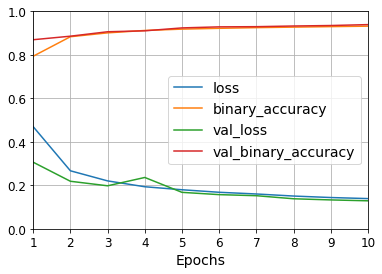

10848/10848 [==============================] - 1s 111us/sample - loss: 0.2244 - binary_accuracy: 0.8783

 Test loss: 0.22436437    Test accuracy: 0.87833524
Prediction (Training samples):


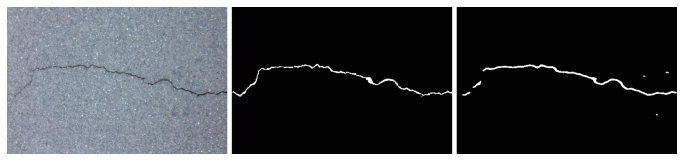

Prediction (Testing samples):


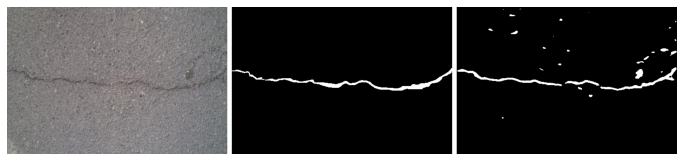

evaluation time: 0.42 mins
Average Testing Precision: 0.54347826
Average Testing Recall:    0.69137168
Average Testing F1:        0.60856865


In [55]:
# Use the same training and testing images
h = 9
s = 3
precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=64, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [56]:
df_score3 = df_score3.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                          index=[df_score3.shape[0]+1], 
                                          columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score3.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,1,1,13,3,0.548820,0.754425,0.635404
2,1,1,9,3,0.543478,0.691372,0.608569


#### <font color="red"> $h=11$, $s=3$ </font>
- Input patch size: $[2h+1, 2h+1] = [23, 23]$
- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [7, 7]$

Training set: input shape: (6556, 23, 23, 3), output shape: (6556, 49)
Testing set: input shape: (10848, 23, 23, 3), output shape: (10848, 49)
Training samples:


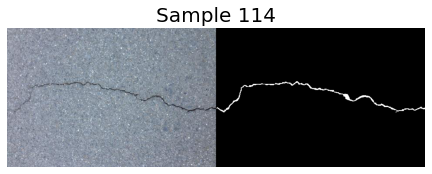

Testing samples:


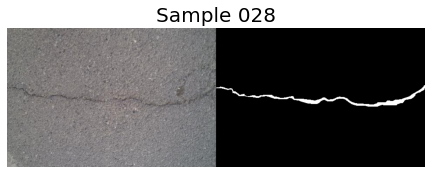

Train on 5244 samples, validate on 1312 samples
Epoch 1/10
5244/5244 [==============================] - 3s 591us/sample - loss: 0.4611 - binary_accuracy: 0.7898 - val_loss: 0.2357 - val_binary_accuracy: 0.8724
Epoch 2/10
5244/5244 [==============================] - 1s 148us/sample - loss: 0.2391 - binary_accuracy: 0.8852 - val_loss: 0.2204 - val_binary_accuracy: 0.8921
Epoch 3/10
5244/5244 [==============================] - 1s 151us/sample - loss: 0.2031 - binary_accuracy: 0.9018 - val_loss: 0.1994 - val_binary_accuracy: 0.9089
Epoch 4/10
5244/5244 [==============================] - 1s 152us/sample - loss: 0.1895 - binary_accuracy: 0.9107 - val_loss: 0.2153 - val_binary_accuracy: 0.9130
Epoch 5/10
5244/5244 [==============================] - 1s 149us/sample - loss: 0.1754 - binary_accuracy: 0.9171 - val_loss: 0.1606 - val_binary_accuracy: 0.9251
Epoch 6/10
5244/5244 [==============================] - 1s 151us/sample - loss: 0.1622 - binary_accuracy: 0.9220 - val_loss: 0.1567 - val_bina

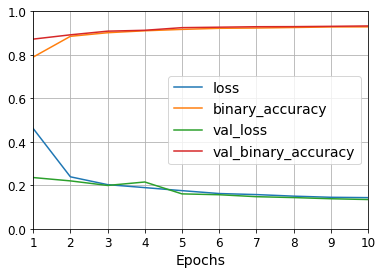

10848/10848 [==============================] - 1s 115us/sample - loss: 0.2310 - binary_accuracy: 0.8887

 Test loss: 0.23095996    Test accuracy: 0.88872379
Prediction (Training samples):


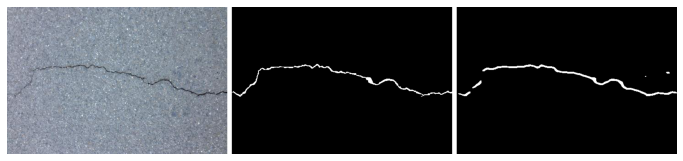

Prediction (Testing samples):


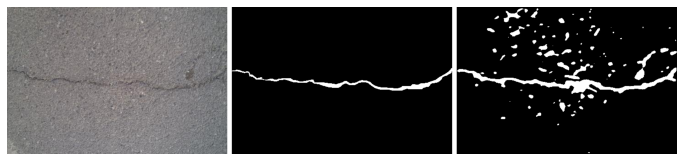

evaluation time: 0.46 mins
Average Testing Precision: 0.23954045
Average Testing Recall:    0.92256637
Average Testing F1:        0.38032986


In [57]:
# Use the same training and testing images
h = 11
s = 3
precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=64, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [58]:
df_score3 = df_score3.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                          index=[df_score3.shape[0]+1], 
                                          columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score3.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,1,1,13,3,0.548820,0.754425,0.635404
2,1,1,9,3,0.543478,0.691372,0.608569
3,1,1,11,3,0.239540,0.922566,0.380330


#### <font color="red"> $h=15$, $s=3$ </font>
- Input patch size: $[2h+1, 2h+1] = [31, 31]$
- Output patch size $(s_{out} = 2s+1): [2s+1, 2s+1] = [7, 7]$

Training set: input shape: (6556, 31, 31, 3), output shape: (6556, 49)
Testing set: input shape: (10848, 31, 31, 3), output shape: (10848, 49)
Training samples:


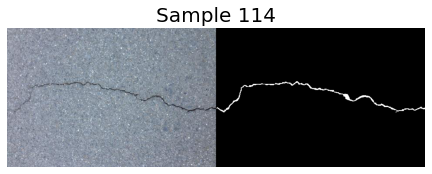

Testing samples:


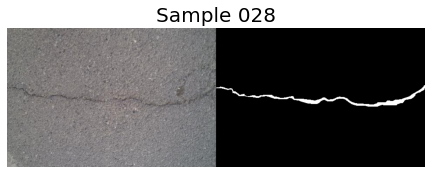

Train on 5244 samples, validate on 1312 samples
Epoch 1/10
5244/5244 [==============================] - 3s 539us/sample - loss: 0.4772 - binary_accuracy: 0.7915 - val_loss: 0.3052 - val_binary_accuracy: 0.8822
Epoch 2/10
5244/5244 [==============================] - 1s 198us/sample - loss: 0.2543 - binary_accuracy: 0.8795 - val_loss: 0.2282 - val_binary_accuracy: 0.8865
Epoch 3/10
5244/5244 [==============================] - 1s 206us/sample - loss: 0.2089 - binary_accuracy: 0.8900 - val_loss: 0.1830 - val_binary_accuracy: 0.9085
Epoch 4/10
5244/5244 [==============================] - 1s 190us/sample - loss: 0.1902 - binary_accuracy: 0.9012 - val_loss: 0.1733 - val_binary_accuracy: 0.9133
Epoch 5/10
5244/5244 [==============================] - 1s 173us/sample - loss: 0.1812 - binary_accuracy: 0.9066 - val_loss: 0.1716 - val_binary_accuracy: 0.9140
Epoch 6/10
5244/5244 [==============================] - 1s 179us/sample - loss: 0.1774 - binary_accuracy: 0.9099 - val_loss: 0.1669 - val_bina

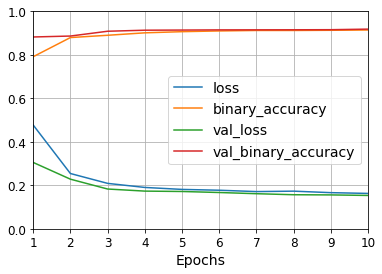

10848/10848 [==============================] - 1s 127us/sample - loss: 0.2894 - binary_accuracy: 0.8566

 Test loss: 0.28936810    Test accuracy: 0.85660464
Prediction (Training samples):


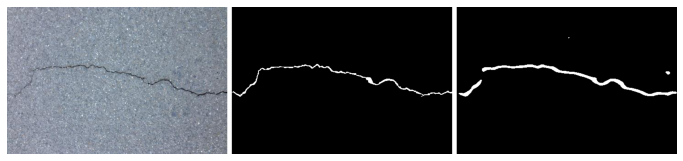

Prediction (Testing samples):


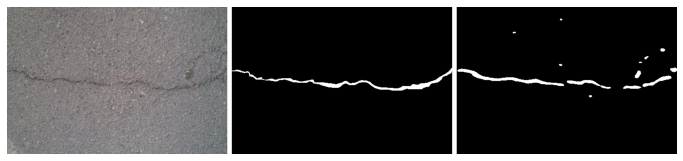

evaluation time: 0.55 mins
Average Testing Precision: 0.54022989
Average Testing Recall:    0.64122419
Average Testing F1:        0.58641039


In [59]:
# Use the same training and testing samples
h = 15
s = 3
precision,recall,f1 = cnn_crack(train_id, test_id, h=h, s=s, ratio=3.0, lr=1e-3, epoch=10, batch_size=64, 
                                optimizer='adam', plot_sample=True, save_model=False, plot_loss=True)

In [60]:
df_score3 = df_score3.append(pd.DataFrame([[train_id.size, test_id.size, h, s, precision, recall, f1]], 
                                          index=[df_score3.shape[0]+1], 
                                          columns=['n_train', 'n_test', 'h', 's', 'test_Precision', 'test_Recall', 'test_F1']))
df_score3.head()

,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
1,1,1,13,3,0.548820,0.754425,0.635404
2,1,1,9,3,0.543478,0.691372,0.608569
3,1,1,11,3,0.239540,0.922566,0.380330
4,1,1,15,3,0.540230,0.641224,0.586410


In [61]:
df_score3.sort_values(by=['h'], inplace=True)
df_score3.head()

ERROR! Session/line number was not unique in database. History logging moved to new session 1333


,n_train,n_test,h,s,test_Precision,test_Recall,test_F1
2,1,1,9,3,0.543478,0.691372,0.608569
3,1,1,11,3,0.239540,0.922566,0.380330
1,1,1,13,3,0.548820,0.754425,0.635404
4,1,1,15,3,0.540230,0.641224,0.586410


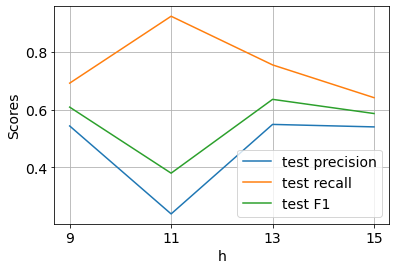

In [62]:
# Plot testing scores
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111)
ax.plot(df_score3.iloc[:,2], df_score3.iloc[:,4], label='test precision')
ax.plot(df_score3.iloc[:,2], df_score3.iloc[:,5], label='test recall')
ax.plot(df_score3.iloc[:,2], df_score3.iloc[:,6], label='test F1')
ax.grid()
ax.set_xlabel('h', fontsize=14)
ax.set_ylabel('Scores', fontsize=14)
ax.set_xticks(df_score3.iloc[:,2])
ax.tick_params(labelsize=14)
ax.legend(fontsize=14)

# References

1. Fan, Z., Wu, Y., Lu, J., & Li, W. (2018). Automatic pavement crack detection based on structured prediction with the convolutional neural network. arXiv preprint arXiv:1802.02208.